 <img src="https://minas.medellin.unal.edu.co/images/noticias/logoUN.gif" alt="logo" width="250">

<center> <h2> Taller  </h2> </center>
<center> <h2> Visión Artificial </h2> </center>
<center> <h2> 2024-1S </h2> </center>


### Nota:
Todo punto debe de tener una explicación de lo que se está haciendo y por qué se está haciendo, de lo contrario no se tendrá en cuenta (se pone 0 en el punto).

#### Nombre: Leonard David Vivas y Tomás Escobar Rivera

#### Documento de identidad: 1070947936 y 1036448606

### Correo: lvivasd@unal.edu.co y tescobarr@unal.edu.co

In [206]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import math
from skimage import morphology
from skimage.measure import label, regionprops
from skimage.feature import graycomatrix, graycoprops
from scipy.stats import kurtosis
from scipy.stats import skew

## Punto 1 (10%)

### A. (1%)
Tomar una fotografía de un objeto de estudio que se desee identificar o estudiar, leer la imagen en RGB con opencv y mostrar la imagen, asegurándose de que no provenga de un conjunto de datos preexistente (En caso de usar una imagen de internet su nota TOTAL se verá reducida considerablemente, si la imagen es muy sencilla de analizar también se le reducirá considerablemente su calificación TOTAL)

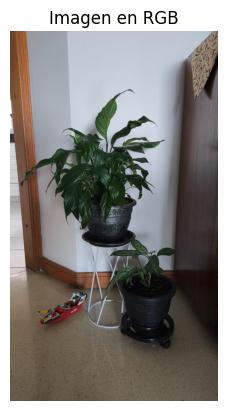

In [207]:
img = cv2.imread('img.jpg') # Leer la imagen
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convertir la imagen a RGB

# Se muestra la imagen
plt.imshow(img)
plt.title('Imagen en RGB')
plt.axis('off')
plt.show()

### B. (1%)
Describir el entorno en el que se tomó la foto, como la ubicación, las condiciones climáticas y la iluminación. Por ejemplo, la foto se tomó en un jardín local en un día soleado con luz natural. Detallar el tamaño de la imagen (por ejemplo, 1920x1080 píxeles) y su formato (por ejemplo, JPEG, PNG, TIF).


La imagen tiene formato JPG y dimensiones 899x1600.

La foto fue tomada en un espacio interior. Las plantas están colocadas en macetas. Como no se trata de un espacio al aire libre, no influyen mucho las condiciones climáticas externas.

En cuanto a la iluminación, es luz natural, proveniente de una ventana. La iluminación es suave y no hay sombras duras, ya que la foto fue tomada durante el día, dando como resultado una luz difusa, lo que crea un ambiente cálido.

### C. (2.5%)
Analizar el histograma de la imagen para observar la distribución de las intensidades de los píxeles y su relación con las características visuales del objeto y el entorno.

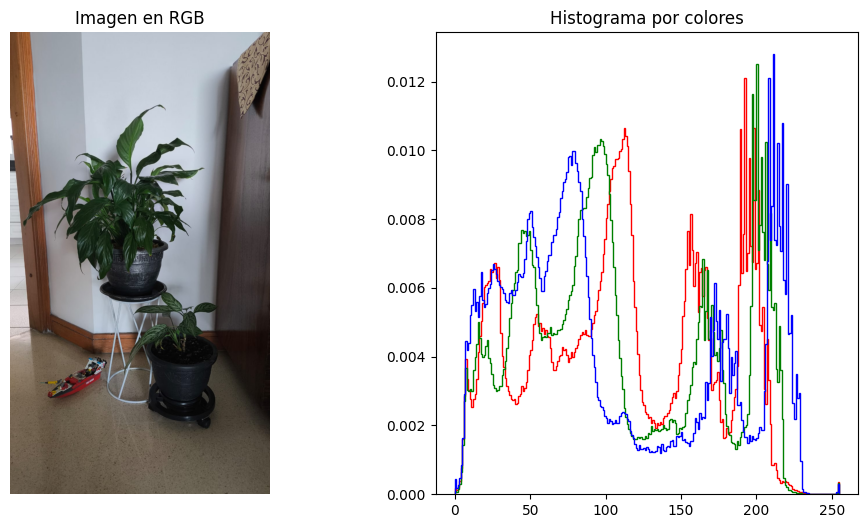

In [208]:
# Definir los colores para el histograma
colors = ['r', 'g', 'b']

# Crear una figura y ejes para el histograma
fig, arr_axs = plt.subplots(1, 2, figsize=(12, 6))

# Mostrar la imagen original en el primer eje
arr_axs[0].imshow(img)
arr_axs[0].set_title('Imagen en RGB')
arr_axs[0].axis('off')

# Título para el histograma
arr_axs[1].set_title('Histograma por colores')

# Generar el histograma para cada canal de color
for i, col in enumerate(colors):
    tricolor_str_img_rgb_array_i = img[:, :, i].ravel()
    arr_axs[1].hist(tricolor_str_img_rgb_array_i, histtype='step', bins=255,
                    range=(0.0, 255.0), density=True, color=col)

# Mostrar la figura
plt.show()

1. Canal Rojo (Línea roja):

Observamos un pico elevado entre las intensidades 100-150, lo que sugiere una presencia notable de colores rojos o tonos cálidos en esa gama. En la imagen, no parece haber objetos rojos evidentes, pero podría haber tonos cálidos reflejados en las superficies o en el entorno iluminado.

2. Canal Verde (Línea verde):

El pico más alto en este canal aparece en el rango de intensidades alrededor de 150-200. Esto tiene sentido, dado que hay una notable presencia de verde en las hojas de las plantas. El pico representa las hojas y la vegetación de las plantas, que son los elementos más dominantes en color verde.

3. Canal Azul (Línea azul):

La línea azul también tiene un gran pico en intensidades entre 100-200, lo cual puede estar asociado con la luz en el entorno y las sombras, o puede que el fondo o algunas áreas de la imagen estén reflejando más luz en tonos fríos.

### D. (2.5%)

Estudiar el espacio de color de la imagen, con el objetivo de identificar en qué canales se puede distinguir mejor el objeto de estudio. Seleccionar los canales de color candidatos donde se identifique mejor el objeto de estudio.


In [209]:
def espacios_de_color(img):
    """
    Función que muestra la imagen que recibe como parámetro y sus diferentes canales de color, con el fin de estudiar los espacios de color de la imagen seleccionada
    :param img: Imagen que se desea estudiar, ingresa leída en formato RGB
    :return: Retorno nulo, se muestran los canales de los espacios mediante la librería matplotlib
    """

    # Espacio RGB
    img_R_RGB = img[:,:,0] # Canal R
    img_G_RGB = img[:,:,1] # Canal G
    img_B_RGB = img[:,:,2] # Canal B
    # Para RGB en escala de grises basta con cambiar el cmap a 'gray'

    # Espacio CMY
    img_C_CMY = 255 - img_R_RGB # Canal C
    img_M_CMY = 255 - img_G_RGB # Canal M
    img_Y_CMY = 255 - img_B_RGB # Canal Y

    # Espacio YIQ
    img_Y_YIQ = 0.299*img_R_RGB + 0.587*img_G_RGB + 0.114*img_B_RGB # Canal Y
    img_I_YIQ = 0.596*img_R_RGB - 0.274*img_G_RGB - 0.322*img_B_RGB # Canal I
    img_Q_YIQ = 0.211*img_R_RGB - 0.523*img_G_RGB + 0.312*img_B_RGB # Canal Q

    # Espacio YUV
    img_YUV = cv2.cvtColor(img, cv2.COLOR_BGR2YUV) # Se cambia el formato de color de cv2 a YUV

    img_Y_YUV = img_YUV[:,:,0] # Canal Y
    img_U_YUV =  img_YUV[:,:,1] # Canal U
    img_V_YUV = img_YUV[:,:,2] # Canal V

    # Espacio HSL
    # Normalizar la imagen
    img_normalizada = img.astype(np.float32)/255
    img_R_HSL = img_normalizada[:,:,0] # Canal R
    img_G_HSL = img_normalizada[:,:,1] # Canal G
    img_B_HSL = img_normalizada[:,:,2] # Canal B

    tam = np.shape(img_normalizada)
    img_HSL =np.zeros(tam, dtype=np.float32)

    for i in range(tam[0]):
        for j in range(tam[1]):
            # Sacar el máximo y el mínimo valor al recorrer las filas y columnas
            max_val = np.max(img_normalizada[i][j])
            min_val = np.min(img_normalizada[i][j])
            # Crear los canales S y L del espacio HSL mediante transformaciones lineales
            s = max_val - min_val
            l = s/2
            # Asignación de los canales a la matriz img_hsl
            img_HSL[i][j][1] = s
            img_HSL[i][j][2] = l
            # Asignación de valores al canal H
            if max_val == min_val:
                img_HSL[i][j][0] = 0
                continue
            # Extracción de los canales del espacio RGB de la imagen
            red = img_normalizada[i][j][0]
            green = img_normalizada[i][j][1]
            blue = img_normalizada[i][j][2]
            # Normalización de los datos, en caso de que el vector max_val sea exactamente igual a uno de los canales del espacio RGB
            if max_val == red:
                h = (green-blue)*60/(max_val-min_val)
            elif max_val == green:
                h = (blue-red)*60/(max_val-min_val) + 120
            else:
                h = (red-green)*60/(max_val-min_val) + 240
            # Condicional para que cada valor de h esté acotado entre 0 y 360 en cada iteración
            if h >= 0:
                img_HSL[i,j,0] = h
            else:
                img_HSL[i,j,0] = 360.0 - h

    # Espacio HSV
    img_HSV = cv2.cvtColor(img, cv2.COLOR_BGR2HSV) # Se cambia el formato de color de cv2 a HSV

    img_H_HSV = img_HSV[:,:,0] # Canal H
    img_S_HSV =  img_HSV[:,:,1] # Canal S
    img_V_HSV = img_HSV[:,:,2] # Canal V

    # Espacio LAB
    img_LAB = cv2.cvtColor(img, cv2.COLOR_BGR2LAB) # Se cambia el formato de color de cv2 a LAB

    img_L_LAB = img_LAB[:,:,0] # Canal L
    img_A_LAB =  img_LAB[:,:,1] # Canal A
    img_B_LAB = img_LAB[:,:,2] # Canal B


    # Mostrar las imágenes: Se realizará en el mismo orden en que se presentaron los espacios de color y con un formato de fila por espacio de color
    fig, axs = plt.subplots(9, 3, figsize=(10, 25))

    # Imagen original
    axs[0, 1].imshow(img)
    axs[0, 1].axis('off')
    axs[0, 1].set_title('Imagen original')

    axs[0, 0].remove()
    axs[0, 2].remove()

    # Espacio RGB
    axs[1, 0].imshow(img_R_RGB, aspect='equal')
    axs[1, 0].axis('off')
    axs[1, 0].set_title('R (RGB)')
    axs[1, 1].imshow(img_G_RGB, aspect='equal')
    axs[1, 1].axis('off')
    axs[1, 1].set_title('G (RGB)')
    axs[1, 2].imshow(img_B_RGB, aspect='equal')
    axs[1, 2].axis('off')
    axs[1, 2].set_title('B (RGB)')

    # Espacio RGB en escala de grises
    axs[2, 0].imshow(img_R_RGB, cmap='gray', aspect='equal')
    axs[2, 0].axis('off')
    axs[2, 0].set_title('R (RGB) en escala de grises')
    axs[2, 1].imshow(img_G_RGB, cmap='gray', aspect='equal')
    axs[2, 1].axis('off')
    axs[2, 1].set_title('G (RGB) en escala de grises')
    axs[2, 2].imshow(img_B_RGB, cmap='gray', aspect='equal')
    axs[2, 2].axis('off')
    axs[2, 2].set_title('B (RGB) en escala de grises')

    # Espacio CMY
    axs[3, 0].imshow(img_C_CMY, cmap='GnBu', aspect='equal')
    axs[3, 0].axis('off')
    axs[3, 0].set_title('C (CMY)')
    axs[3, 1].imshow(img_M_CMY, cmap='RdPu', aspect='equal')
    axs[3, 1].axis('off')
    axs[3, 1].set_title('M (CMY)')
    axs[3, 2].imshow(img_Y_CMY, cmap='YlOrBr', aspect='equal')
    axs[3, 2].axis('off')
    axs[3, 2].set_title('Y (CMY)')

    # Espacio YIQ
    axs[4, 0].imshow(img_Y_YIQ, cmap='gray', aspect='equal')
    axs[4, 0].axis('off')
    axs[4, 0].set_title('Y (YIQ)')
    axs[4, 1].imshow(img_I_YIQ, cmap='gray', aspect='equal')
    axs[4, 1].axis('off')
    axs[4, 1].set_title('I (YIQ)')
    axs[4, 2].imshow(img_Q_YIQ, cmap='gray', aspect='equal')
    axs[4, 2].axis('off')
    axs[4, 2].set_title('Q (YIQ)')

    # Espacio YUV
    axs[5, 0].imshow(img_Y_YUV, cmap='gray', aspect='equal')
    axs[5, 0].axis('off')
    axs[5, 0].set_title('Y (YUV)')
    axs[5, 1].imshow(img_U_YUV, cmap='gray', aspect='equal')
    axs[5, 1].axis('off')
    axs[5, 1].set_title('U (YUV)')
    axs[5, 2].imshow(img_V_YUV, cmap='gray', aspect='equal')
    axs[5, 2].axis('off')
    axs[5, 2].set_title('V (YUV)')

    # Espacio HSL
    axs[6, 0].imshow(img_HSL[:,:,0], cmap='gray', aspect='equal')
    axs[6, 0].axis('off')
    axs[6, 0].set_title('H (HSL)')
    axs[6, 1].imshow(img_HSL[:,:,1], cmap='gray', aspect='equal')
    axs[6, 1].axis('off')
    axs[6, 1].set_title('S (HSL)')
    axs[6, 2].imshow(img_HSL[:,:,2], cmap='gray', aspect='equal')
    axs[6, 2].axis('off')
    axs[6, 2].set_title('L (HSL)')

    # Espacio HSV
    axs[7, 0].imshow(img_H_HSV, cmap='gray', aspect='equal')
    axs[7, 0].axis('off')
    axs[7, 0].set_title('H (HSV)')
    axs[7, 1].imshow(img_S_HSV, cmap='gray', aspect='equal')
    axs[7, 1].axis('off')
    axs[7, 1].set_title('S (HSV)')
    axs[7, 2].imshow(img_V_HSV, cmap='gray', aspect='equal')
    axs[7, 2].axis('off')
    axs[7, 2].set_title('V (HSV)')

    # Espacio LAB
    axs[8, 0].imshow(img_L_LAB, cmap='gray', aspect='equal')
    axs[8, 0].axis('off')
    axs[8, 0].set_title('L (LAB)')
    axs[8, 1].imshow(img_A_LAB, cmap='gray', aspect='equal')
    axs[8, 1].axis('off')
    axs[8, 1].set_title('A (LAB)')
    axs[8, 2].imshow(img_B_LAB, cmap='gray', aspect='equal')
    axs[8, 2].axis('off')
    axs[8, 2].set_title('B (LAB)')

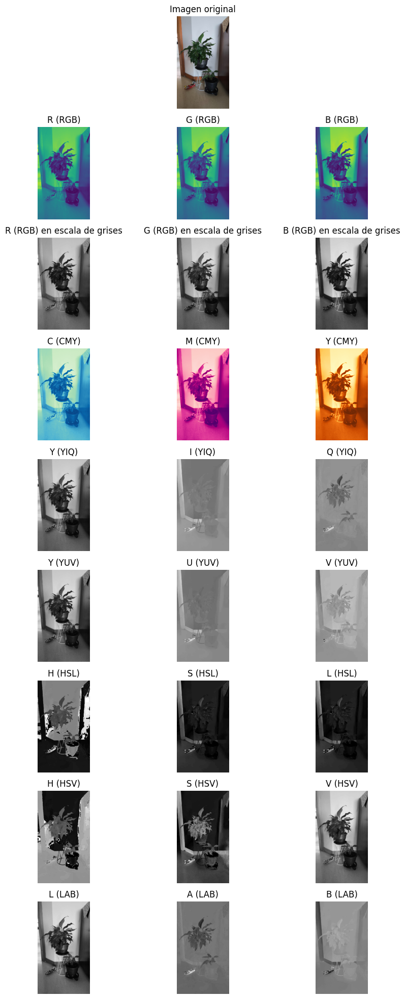

In [210]:
# Se aplica la función de los espacios de color a la imagen seleccionada
espacios_de_color(img)

### E. (3%)

Seleccionar el canal de color donde se identifique mejor el objeto de estudio.

Sin duda alguna, con un poco de revisión de los distintos espacios de color con sus respectivos canales, se puede observar que el canal de color que mejor permite resaltar el objeto de interés, que es la planta, es el ***canal A del espacio de color LAB***, esto debido a que si nos damos cuenta, permite resaltar las hojas verdes de la planta con una gran claridad, usando tonos un poco más oscuros que el resto de fondo que se tiene en la imagen. En este canal además, podemos notar un pequeño reto y/o inconveniente y es que, en la parte inferior izquierda de la imagen, se puede notar que se resalta un poco otro objeto que no es de interés y parece ser un poco de ruido, pero esto se analizará más adelante. En resumidas cuentas, el **canal A del LAB** permite resaltar las hojas de las plantas, haciendo que estas se vean con un tono más oscuro que el fondo de la imagen.

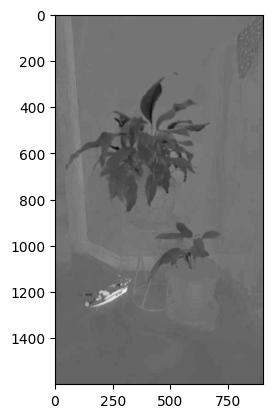

In [211]:
# Seleccionar el canal A del espacio de color LAB
img_LAB = cv2.cvtColor(img, cv2.COLOR_BGR2LAB) # Se cambia el formato de color de cv2 a LAB
img_A_LAB = img_LAB[:,:,1] # Canal A

# Mostrar la imagen en el canal A del espacio de color LAB
plt.imshow(img_A_LAB, cmap='gray')

# Punto 2 (25%)

Después de seleccionar el canal de color apropiado, realice un análisis de las operaciones unarias disponibles y elija la operación candidata que mejor contribuya a la identificación del objeto de estudio. En caso de que ninguna operación unaria resulte útil para mejorar la identificación del objeto de estudio, justifique esta conclusión, explique por qué las operaciones estudiadas no han sido efectivas y cómo sus efectos en la imagen no han sido suficientes para resaltar las características del objeto.

<b>Ayuda:</b> Use el histograma en el canal seleccionado.

Basándose en los resultados obtenidos en los puntos anteriores, realice un estudio detallado de las transformaciones no lineales, con el objetivo de identificar posibles operaciones que permitan mejorar la detección del objeto de estudio.

Si encuentra una transformación no lineal que mejora significativamente la identificación del objeto, describa cómo esta transformación contribuye a resaltar sus características y facilita su detección. Explique cómo los ajustes en los parámetros de la transformación seleccionada influyen en el resultado y cómo optimizar estos ajustes para lograr la mayor eficacia en la búsqueda del objeto.

En caso de que ninguna transformación no lineal resulte útil para mejorar la identificación del objeto de estudio, justifique esta conclusión. Explique por qué las transformaciones estudiadas no han sido efectivas y cómo sus efectos en la imagen no han sido suficientes para resaltar las características del objeto.

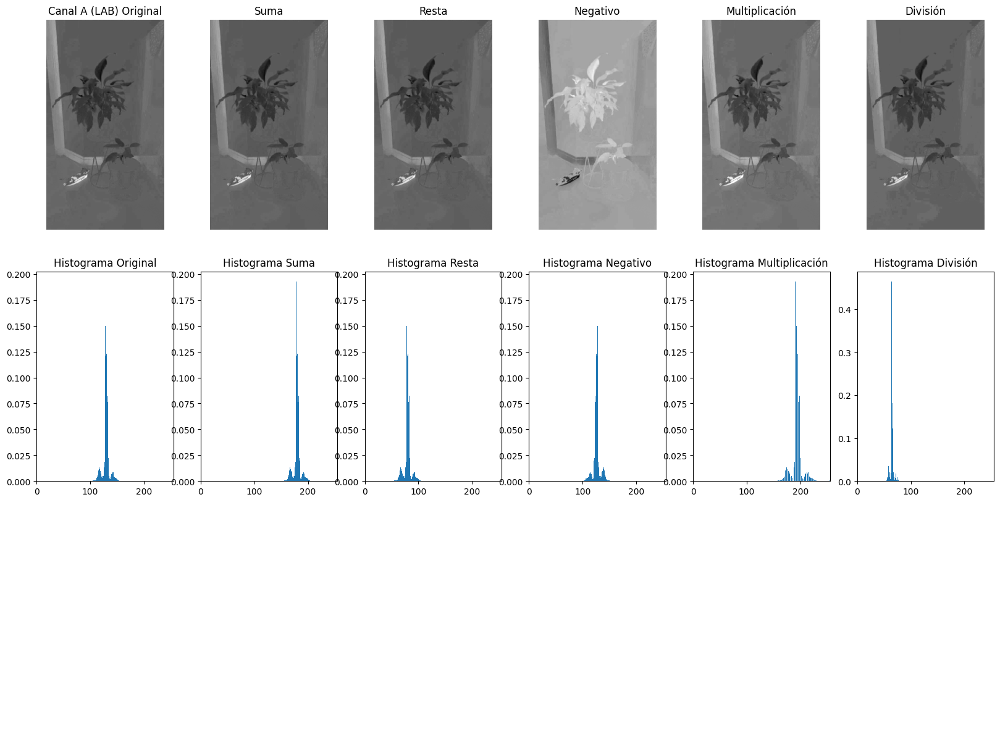

In [212]:
def lineales(img):
    '''
    Función que aplica operaciones unarias al canal A del espacio LAB de la imagen y muestra los resultados.
    :param img: Imagen en formato numpy array
    :return: Retorno nulo, se muestran las imágenes resultantes de las operaciones unarias
    '''
    # Convertir la imagen al espacio de color LAB
    img_lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    img_lab_a = img_lab[:, :, 1]  # Extraer el canal A

    # Suma
    img_sum = cv2.add(img_lab_a, 50)  # Sumar 50 a cada píxel

    # Resta
    img_subtract = cv2.subtract(img_lab_a, 50)  # Restar 50 a cada píxel

    # Negativo
    img_negative = cv2.bitwise_not(img_lab_a)  # Invertir los colores

    # Multiplicación
    img_multiply = cv2.multiply(img_lab_a, 1.5)  # Multiplicar cada píxel por 1.5

    # División
    img_divide = cv2.divide(img_lab_a, 2)  # Dividir cada píxel por 2

    # Mostrar las imágenes resultantes y sus histogramas
    fig, axs = plt.subplots(3, 6, figsize=(20, 15))

    axs[0, 0].imshow(img_lab_a, cmap='gray')
    axs[0, 0].set_title('Canal A (LAB) Original')
    axs[0, 0].axis('off')
    axs[1, 0].hist(img_lab_a.ravel(), bins=255, range=(0.0, 255.0), density=True)
    axs[1, 0].set_title('Histograma Original')
    axs[1, 0].set_xlim([0, 255])
    axs[2, 0].axis('off')

    axs[0, 1].imshow(img_sum, cmap='gray')
    axs[0, 1].set_title('Suma')
    axs[0, 1].axis('off')
    axs[1, 1].hist(img_sum.ravel(), bins=255, range=(0.0, 255.0), density=True)
    axs[1, 1].set_title('Histograma Suma')
    axs[1, 1].set_xlim([0, 255])
    axs[2, 1].axis('off')

    axs[0, 2].imshow(img_subtract, cmap='gray')
    axs[0, 2].set_title('Resta')
    axs[0, 2].axis('off')
    axs[1, 2].hist(img_subtract.ravel(), bins=255, range=(0.0, 255.0), density=True)
    axs[1, 2].set_title('Histograma Resta')
    axs[1, 2].set_xlim([0, 255])
    axs[2, 2].axis('off')

    axs[0, 3].imshow(img_negative, cmap='gray')
    axs[0, 3].set_title('Negativo')
    axs[0, 3].axis('off')
    axs[1, 3].hist(img_negative.ravel(), bins=255, range=(0.0, 255.0), density=True)
    axs[1, 3].set_title('Histograma Negativo')
    axs[1, 3].set_xlim([0, 255])
    axs[2, 3].axis('off')

    axs[0, 4].imshow(img_multiply, cmap='gray')
    axs[0, 4].set_title('Multiplicación')
    axs[0, 4].axis('off')
    axs[1, 4].hist(img_multiply.ravel(), bins=255, range=(0.0, 255.0), density=True)
    axs[1, 4].set_title('Histograma Multiplicación')
    axs[1, 4].set_xlim([0, 255])
    axs[2, 4].axis('off')

    axs[0, 5].imshow(img_divide, cmap='gray')
    axs[0, 5].set_title('División')
    axs[0, 5].axis('off')
    axs[1, 5].hist(img_divide.ravel(), bins=255, range=(0.0, 255.0), density=True)
    axs[1, 5].set_title('Histograma División')
    axs[1, 5].set_xlim([0, 255])
    axs[2, 5].axis('off')

    plt.show()

lineales(img)

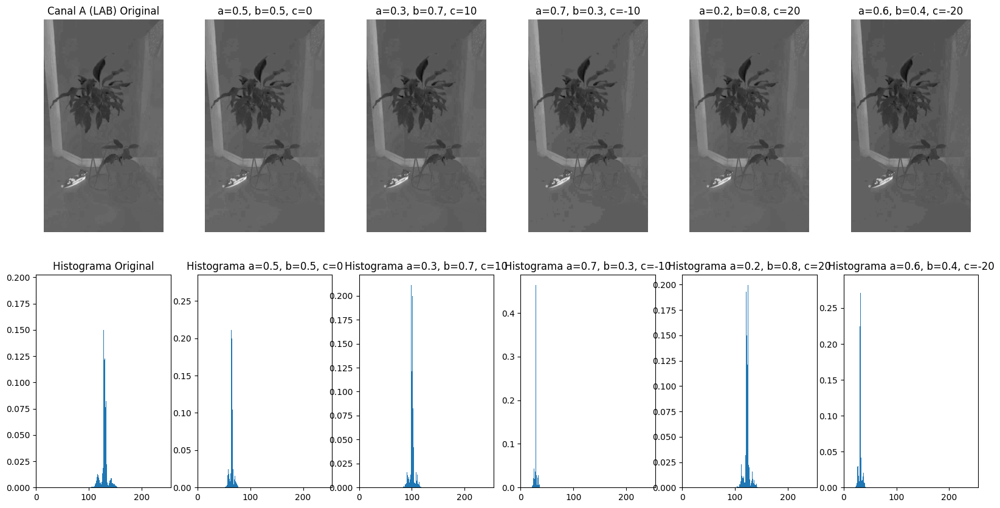

In [213]:
# Fórmula cuadrática

def quadratic_transformation(img_lab_a, a_quad, b_quad, c_quad):
    '''
    Aplica una transformación cuadrática al canal A del espacio LAB de la imagen.
    :param img_lab_a: Canal A de la imagen en espacio LAB
    :param a_quad: Coeficiente cuadrático
    :param b_quad: Coeficiente lineal
    :param c_quad: Término constante
    :return: Imagen transformada
    '''
    return np.clip(a_quad * (img_lab_a ** 2 / 255) + b_quad * img_lab_a + c_quad, 0, 255).astype(np.uint8)

# Convertir la imagen al espacio de color LAB
img_lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
img_lab_a = img_lab[:, :, 1]  # Extraer el canal A

# Definir diferentes combinaciones de a, b y c
combinations = [
    (0.5, 0.5, 0),
    (0.3, 0.7, 10),
    (0.7, 0.3, -10),
    (0.2, 0.8, 20),
    (0.6, 0.4, -20)
]

# Aplicar las transformaciones y mostrar las imágenes resultantes
fig, axs = plt.subplots(2, 6, figsize=(20, 10))

# Mostrar la imagen original
axs[0, 0].imshow(img_lab_a, cmap='gray')
axs[0, 0].set_title('Canal A (LAB) Original')
axs[0, 0].axis('off')
axs[1, 0].hist(img_lab_a.ravel(), bins=255, range=(0.0, 255.0), density=True)
axs[1, 0].set_title('Histograma Original')
axs[1, 0].set_xlim([0, 255])

for idx, (a, b, c) in enumerate(combinations):
    transformed_img = quadratic_transformation(img_lab_a, a, b, c)
    axs[0, idx + 1].imshow(transformed_img, cmap='gray')
    axs[0, idx + 1].set_title(f'a={a}, b={b}, c={c}')
    axs[0, idx + 1].axis('off')
    axs[1, idx + 1].hist(transformed_img.ravel(), bins=255, range=(0.0, 255.0), density=True)
    axs[1, idx + 1].set_title(f'Histograma a={a}, b={b}, c={c}')
    axs[1, idx + 1].set_xlim([0, 255])

plt.show()

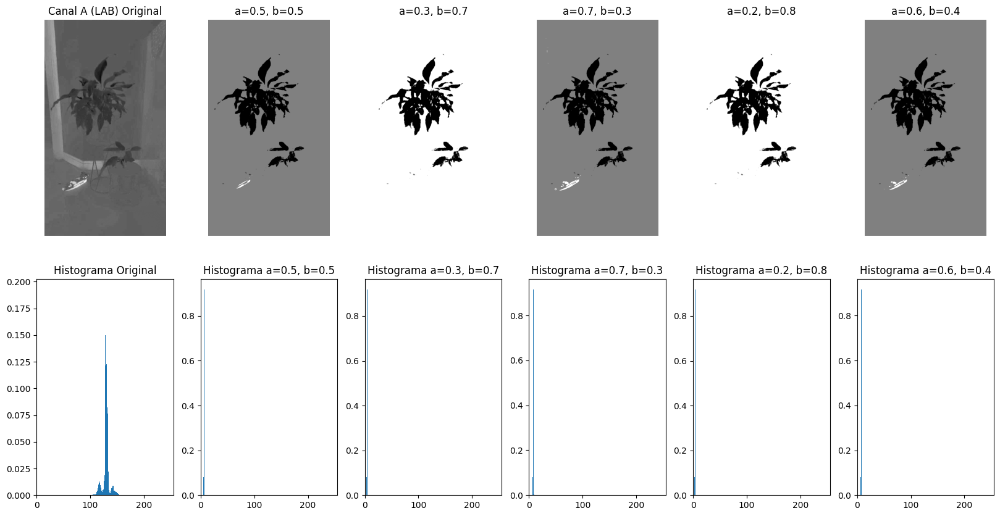

In [214]:
def sqrt_transformation(img_lab_a, a_sqrt, b_sqrt):
    '''
    Aplica una transformación de raíz cuadrada al canal A del espacio LAB de la imagen.
    :param img_lab_a: Canal A de la imagen en espacio LAB
    :param a_sqrt: Coeficiente de la raíz cuadrada
    :param b_sqrt: Coeficiente lineal
    :return: Imagen transformada
    '''
    return np.clip(a_sqrt * np.sqrt(img_lab_a) + b_sqrt, 0, 255).astype(np.uint8)

# Convertir la imagen al espacio de color LAB
img_lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
img_lab_a = img_lab[:, :, 1]  # Extraer el canal A

# Definir diferentes combinaciones de a y b
combinations_sqrt = [
    (0.5, 0.5),
    (0.3, 0.7),
    (0.7, 0.3),
    (0.2, 0.8),
    (0.6, 0.4)
]

# Aplicar las transformaciones y mostrar las imágenes resultantes
fig, axs = plt.subplots(2, 6, figsize=(20, 10))

# Mostrar la imagen original
axs[0, 0].imshow(img_lab_a, cmap='gray')
axs[0, 0].set_title('Canal A (LAB) Original')
axs[0, 0].axis('off')
axs[1, 0].hist(img_lab_a.ravel(), bins=255, range=(0.0, 255.0), density=True)
axs[1, 0].set_title('Histograma Original')
axs[1, 0].set_xlim([0, 255])

for idx, (a_sqrt, b_sqrt) in enumerate(combinations_sqrt):
    transformed_img_sqrt = sqrt_transformation(img_lab_a, a_sqrt, b_sqrt)
    axs[0, idx + 1].imshow(transformed_img_sqrt, cmap='gray')
    axs[0, idx + 1].set_title(f'a={a_sqrt}, b={b_sqrt}')
    axs[0, idx + 1].axis('off')
    axs[1, idx + 1].hist(transformed_img_sqrt.ravel(), bins=255, range=(0.0, 255.0), density=True)
    axs[1, idx + 1].set_title(f'Histograma a={a_sqrt}, b={b_sqrt}')
    axs[1, idx + 1].set_xlim([0, 255])

plt.show()

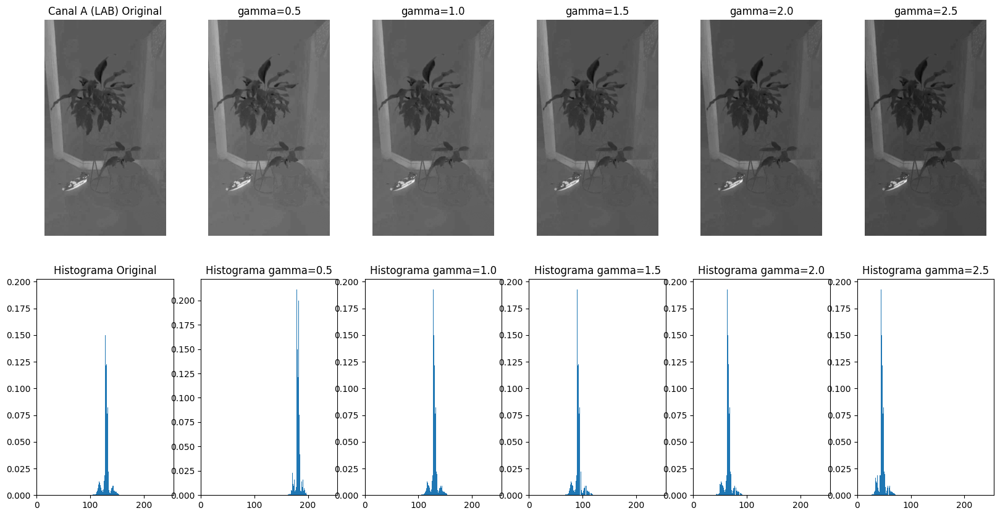

In [215]:
def gamma_correction(img_lab_a, gamma):
    '''
    Aplica una corrección gamma al canal A del espacio LAB de la imagen.
    :param img_lab_a: Canal A de la imagen en espacio LAB
    :param gamma: Valor de gamma
    :return: Imagen transformada
    '''
    return np.clip((img_lab_a / 255.0) ** gamma * 255, 0, 255).astype(np.uint8)

# Definir diferentes valores de gamma
gamma_values = [0.5, 1.0, 1.5, 2.0, 2.5]

# Aplicar las transformaciones y mostrar las imágenes resultantes
fig, axs = plt.subplots(2, 6, figsize=(20, 10))

# Mostrar la imagen original
axs[0, 0].imshow(img_lab_a, cmap='gray')
axs[0, 0].set_title('Canal A (LAB) Original')
axs[0, 0].axis('off')
axs[1, 0].hist(img_lab_a.ravel(), bins=255, range=(0.0, 255.0), density=True)
axs[1, 0].set_title('Histograma Original')
axs[1, 0].set_xlim([0, 255])

for idx, gamma in enumerate(gamma_values):
    transformed_img_gamma = gamma_correction(img_lab_a, gamma)
    axs[0, idx + 1].imshow(transformed_img_gamma, cmap='gray')
    axs[0, idx + 1].set_title(f'gamma={gamma}')
    axs[0, idx + 1].axis('off')
    axs[1, idx + 1].hist(transformed_img_gamma.ravel(), bins=255, range=(0.0, 255.0), density=True)
    axs[1, idx + 1].set_title(f'Histograma gamma={gamma}')
    axs[1, idx + 1].set_xlim([0, 255])

plt.show()

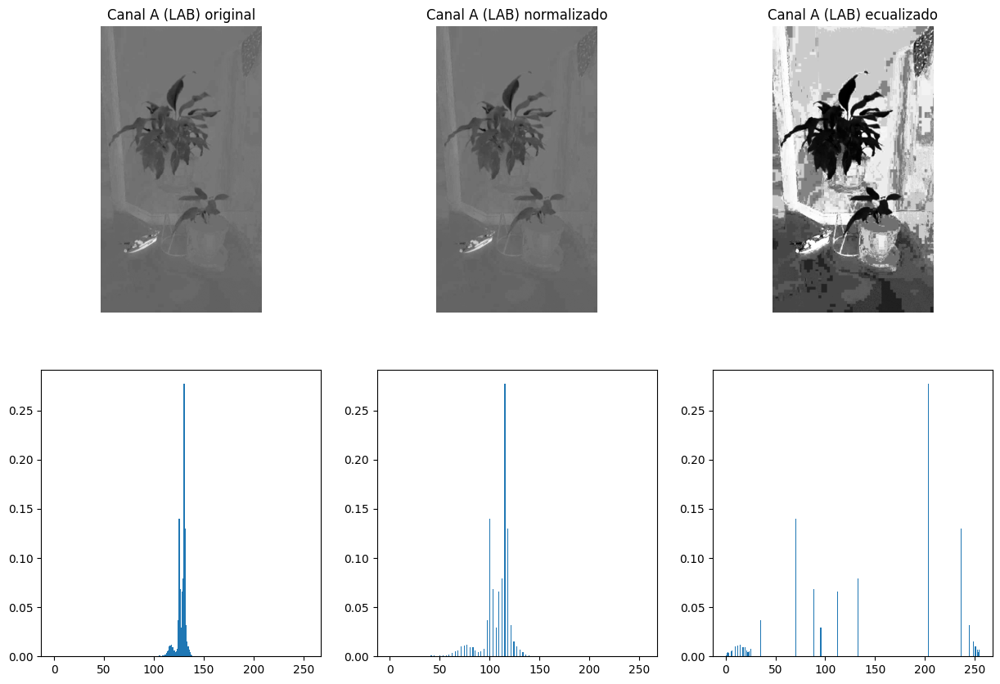

In [216]:
def procesar_histogramas(img):
    # Convertir la imagen a LAB
    img_LAB = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

    # Extraer el canal A
    img_A_LAB = img_LAB[:,:,1]

    # Normalización de histogramas
    m = float(np.min(img_A_LAB))
    M = float(np.max(img_A_LAB))
    img_A_LAB_normalizado = (img_A_LAB - m) * 255.0 / (M - m)
    img_A_LAB_normalizado = img_A_LAB_normalizado.astype(np.uint8)

    # Ecualización de histogramas
    img_A_LAB_ecualizado = cv2.equalizeHist(img_A_LAB)

    # Generar un subplot 2x3 para contrastar imagen original, normalizada y ecualizada con sus histogramas
    fig, axs = plt.subplots(2, 3, figsize=(15, 10))

    # Mostrar la imagen original
    axs[0, 0].imshow(img_A_LAB, cmap='gray')
    axs[0, 0].axis('off')
    axs[0, 0].set_title('Canal A (LAB) original')
    axs[1, 0].hist(img_A_LAB.ravel(), bins=255, range=(0.0, 255.0), density=True)

    # Mostrar la imagen normalizada
    axs[0, 1].imshow(img_A_LAB_normalizado, cmap='gray')
    axs[0, 1].axis('off')
    axs[0, 1].set_title('Canal A (LAB) normalizado')
    axs[1, 1].hist(img_A_LAB_normalizado.ravel(), bins=255, range=(0.0, 255.0), density=True)

    # Mostrar la imagen ecualizada
    axs[0, 2].imshow(img_A_LAB_ecualizado, cmap='gray')
    axs[0, 2].axis('off')
    axs[0, 2].set_title('Canal A (LAB) ecualizado')
    axs[1, 2].hist(img_A_LAB_ecualizado.ravel(), bins=255, range=(0.0, 255.0), density=True)

    plt.show()

    return img_A_LAB_normalizado, img_A_LAB_ecualizado

# Aplicar la transformación a la imagen como prueba
img1_A_LAB_normalizado, img1_A_LAB_ecualizado = procesar_histogramas(img)

### Conclusiones
En cuanto a las transformaciones lineales, no hay una que nos ayude significativamente a nuestro objetivo de segmentar las plantas, pues la mayoría modifican principalmente la iluminación de la imagen, y dado que la imagen ya tiene una buena iluminación de por si, no es necesario aplicarlas. Además, al llevarlas al canal LAB vemos que los cambios no son significativos. De aquí los que mejor resultan son la multiplicación y la división, basado en el resultado de histograma.

Ahora bien, respecto a las transformaciones no lineales, vemos que algunas de ellas cambian drásticamente la imagen y podrían ser de ayuda en nuestra segmentación:

1. La fórmula cuadrática es la que menos influye, ya que los cambios que produce son casi imperceptibles e incluso variando los valores de las constantes no hay cambios, de hecho si no fuera por los histogramas fácilmente se podría decir que son las mismas imágenes.

2. La raíz cuadrada es la que mejores resultados nos da, pues segmenta las plantas casi a la perfección, solo dejando algunos puntos pequeños alrededor de otras cosas que no nos interesan, pero esos puntos son tan pequeños que no valen la pena. Y si bien con la mayoría de valores que testeamos obtenemos buenos resultados, los mejores se obtienen cuando a < b, y no importa mucho en realidad qué tanto varía este valor, mientras que a y b están entre 0 y 1, es decir, por ejemplo los valores de a = 0.3, b = 0.7 o a = 0.2, b = 0.8 son bastante similares y prometedores en el sentido de que funcionan para nuestro propósito, ya que aqui el fondo se vuelve blanco, y queda en negro todos nuestros objetos de interes, mientras que si b <= a, el fondo se vuelve gris, lo que no contrasta tan bien con el negro de nuestro objeto de interes, y hay otros elementos que tambien sobreviven a esta operacion y que nos podrian causar problemas, o que simplemente requeririan un paso extra para eliminarlos, por lo que nos estariamos complicando mas de lo necesario. Y en cuanto a su histograma, podemos ver que cuando a < b, los valores se sitúan ligeramente un poco más a la izquierda, y están muy concentrados en un mismo lugar.

3. Finalmente la corrección gamma, si bien nos da unos resultados buenos, en especial con valores altos como 2.5 (ya que hace que la imagen se vea más oscura y resalta el color de las plantas), no se compara con los resultados de la raíz cuadrada.

Por otra parte, las operaciones que se le aplicaron al histograma tampoco son de ayuda, pues la normalización no modifica el histograma y la ecualización nos dio unos resultados raros, que si bien podrían ser de ayuda porque nos separa bien la planta, sucede lo mismo que la corrección gamma: es bueno pero es superado por la función de raíz cuadrada.

# Punto 3 (15%)

En este punto deberá:
1. Utilizar un filtro de suavizado para reducir el ruido de la imagen.
2. Implementar un algoritmo de detección de bordes.
3. Comparar los resultados con diferentes filtros y algoritmos de detección de bordes

## Filtros de suavizado

Procedemos a implementar primero los filtros, para ver como se comportan en la imagen y así poder seleccionar el más adecuado para la detección de bordes.

### Filtro de la media

In [217]:
def filtro_media(img, kernel):

    # Aplicar el filtro de media
    img_filtro_media = cv2.blur(img, (kernel, kernel), borderType=cv2.BORDER_REPLICATE)

    # Mostrar la imagen
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    axs[0].imshow(img, cmap='gray')
    axs[0].axis('off')
    axs[0].set_title('Imagen original')

    axs[1].imshow(img_filtro_media, cmap='gray')
    axs[1].axis('off')
    axs[1].set_title('Imagen con filtro de media con kernel: ' + str(kernel))

    return img_filtro_media

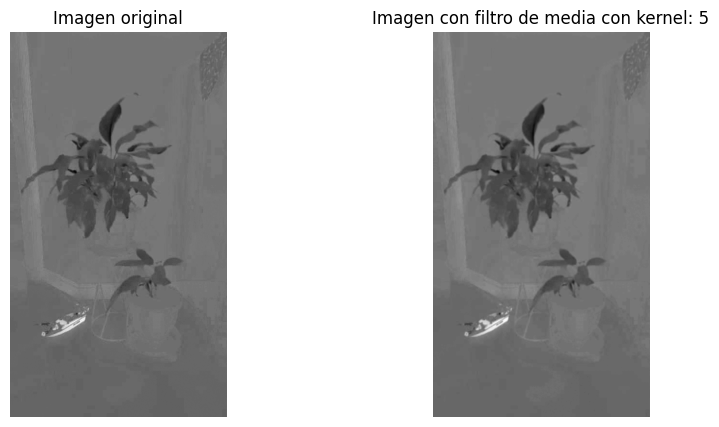

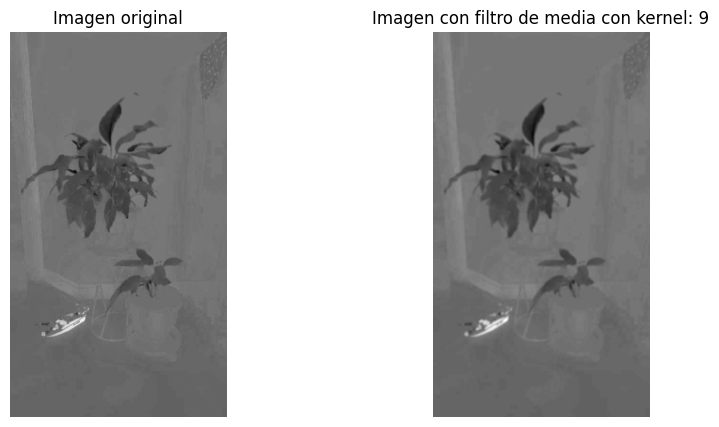

In [218]:
# Aplicar el filtro de media con un kernel de 5x5
img_filtro_media_1 = filtro_media(img_A_LAB, 5)

# Aplicar el filtro de media con un kernel de 9x9
img_filtro_media_2 = filtro_media(img_A_LAB, 9)

### Filtro Gaussiano

In [219]:
def filtro_gaussiano(img, kernel):

    # Aplicar el filtro gaussiano
    img_filtro_gaussiano = cv2.GaussianBlur(img, (kernel, kernel), 2, borderType=cv2.BORDER_REPLICATE)

    # Mostrar la imagen
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    axs[0].imshow(img, cmap='gray')
    axs[0].axis('off')
    axs[0].set_title('Imagen original')

    axs[1].imshow(img_filtro_gaussiano, cmap='gray')
    axs[1].axis('off')
    axs[1].set_title('Imagen con filtro gaussiano de kernel: ' + str(kernel))

    return img_filtro_gaussiano

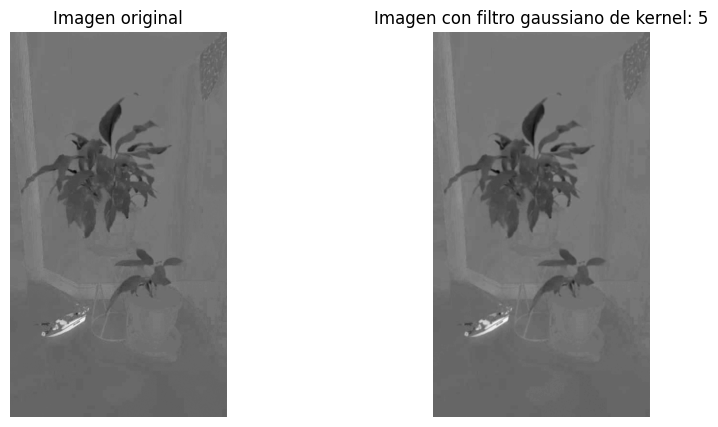

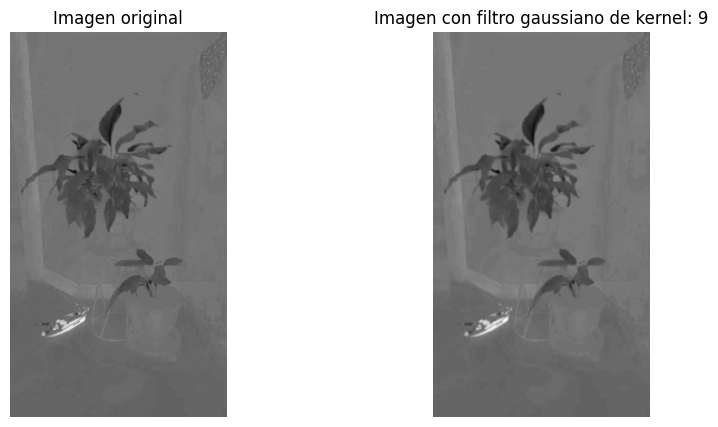

In [220]:
# Aplicar el filtro gaussiano con un kernel de 5x5
img_filtro_gaussiano_1 = filtro_gaussiano(img_A_LAB, 5)

# Aplicar el filtro gaussiano con un kernel de 9x9
img_filtro_gaussiano_2 = filtro_gaussiano(img_A_LAB, 9)

### Filtro de mediana

In [221]:
def filtro_mediana(img, kernel):

    # Aplicar el filtro de mediana
    img_filtro_mediana = cv2.medianBlur(img, kernel)

    # Mostrar la imagen
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    axs[0].imshow(img, cmap='gray')
    axs[0].axis('off')
    axs[0].set_title('Imagen original')

    axs[1].imshow(img_filtro_mediana, cmap='gray')
    axs[1].axis('off')
    axs[1].set_title('Imagen con filtro de mediana de kernel: ' + str(kernel))

    return img_filtro_mediana

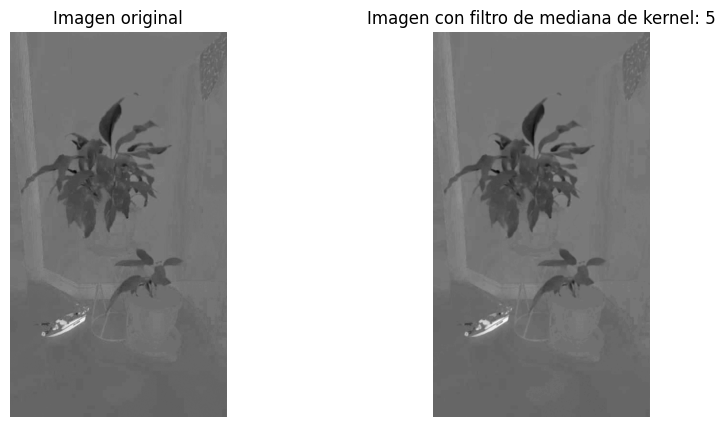

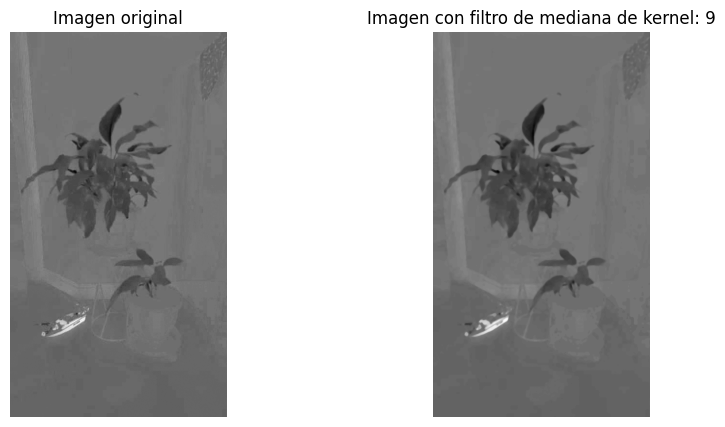

In [222]:
# Aplicar el filtro de mediana con un kernel de 5x5
img_filtro_mediana_1 = filtro_mediana(img_A_LAB, 5)

# Aplicar el filtro de mediana con un kernel de 9x9
img_filtro_mediana_2 = filtro_mediana(img_A_LAB, 9)

### Filtro de Maximo

In [223]:
def filtro_maximo(img, k):
    # Crear una matriz de ceros del tamaño de la imagen de entrada
    res = np.zeros(img.shape, np.uint8)
    # Radio del kernel
    r = math.floor(k/2)
    # Recorrer cada posición i,j de la imagen con el kernel
    for i in range(r, img.shape[0]-r):
        for j in range(r, img.shape[1]-r):
            # Tamaño de la ventana
            window = img[i-r:i+r+1,j-r:j+r+1]
            # Cambiar el valor de la posición i,j de la imagen por el de la ventana
            max_val = np.max(window)
            res[i,j] = max_val


    # Mostrar la imagen
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    axs[0].imshow(img, cmap='gray')
    axs[0].axis('off')
    axs[0].set_title('Imagen original')

    axs[1].imshow(res, cmap='gray')
    axs[1].axis('off')
    axs[1].set_title('Imagen con filtro de máximo de kernel: ' + str(k))

    return res

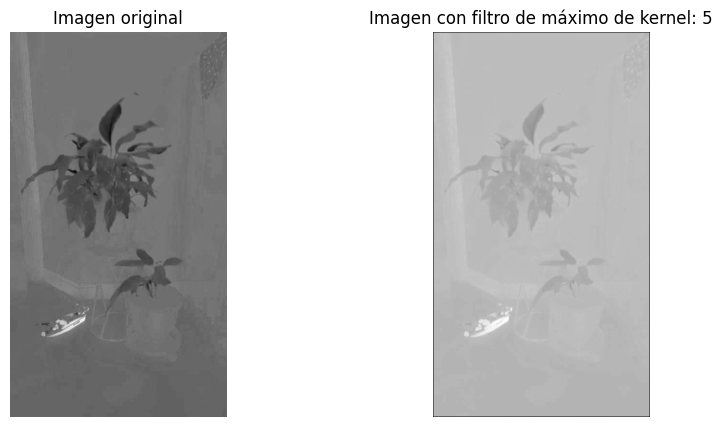

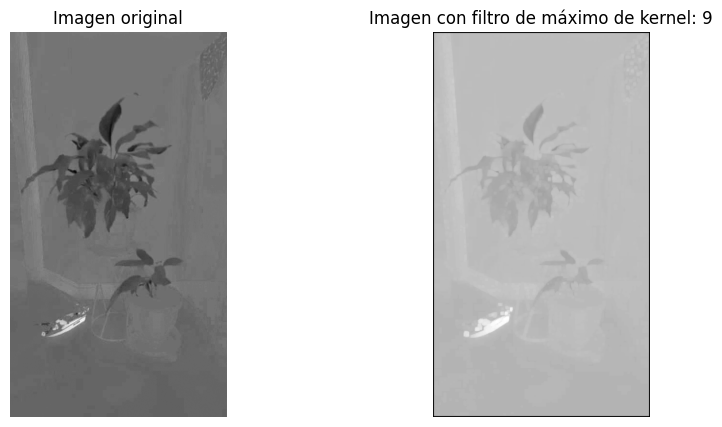

In [224]:
# Aplicar el filtro de maximo con un kernel de 5x5
img_filtro_maximo_1 = filtro_maximo(img_A_LAB, 5)

# Aplicar el filtro de maximo con un kernel de 9x9
img_filtro_maximo_2 = filtro_maximo(img_A_LAB, 9)

### Filtro de Minimo

In [225]:
def filtro_minimo(img, k):
    #Crear matriz de ceros del tamaño de imagen de entrada
    res = np.zeros(img.shape, np.uint8)
    #Definir el radio del kernel
    r = math.floor(k/2)
    #Recorrer cada posición i,j de la imagen con el kernel
    for i in range(r, img.shape[0]-r):
        for j in range(r, img.shape[1]-r):
            #Tamaño de la ventana
            window = img[i-r:i+r+1,j-r:j+r+1]
            #Cambiar el valor de la posición i,j de la imagen por el de la ventana
            min_val = np.min(window)
            res[i,j] = min_val

    # Mostrar la imagen
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    axs[0].imshow(img, cmap='gray')
    axs[0].axis('off')
    axs[0].set_title('Imagen original')

    axs[1].imshow(res, cmap='gray')
    axs[1].axis('off')
    axs[1].set_title('Imagen con filtro de mínimo de kernel: ' + str(k))

    return res

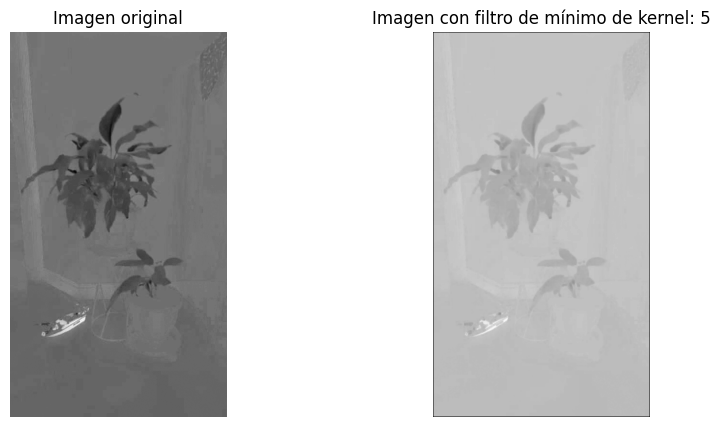

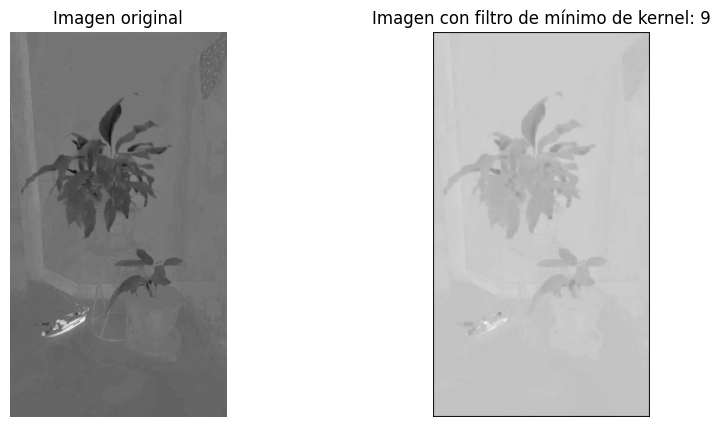

In [226]:
# Aplicar el filtro de minimo con un kernel de 5x5
img_filtro_minimo_1 = filtro_minimo(img_A_LAB, 5)

# Aplicar el filtro de minimo con un kernel de 9x9
img_filtro_minimo_2 = filtro_minimo(img_A_LAB, 9)

### Filtro Bilateral

In [227]:
def filtro_bilateral(img, d, sigmaColor, sigmaSpace):

    # Aplicar el filtro bilateral
    img_filtro_bilateral = cv2.bilateralFilter(img, d, sigmaColor, sigmaSpace)
    img_filtro_bilateral = img_filtro_bilateral.astype(np.uint8)

    # Mostrar la imagen
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    axs[0].imshow(img, cmap='gray')
    axs[0].axis('off')
    axs[0].set_title('Imagen original')

    axs[1].imshow(img_filtro_bilateral, cmap='gray')
    axs[1].axis('off')
    axs[1].set_title('Imagen con filtro bilateral')

    return img_filtro_bilateral

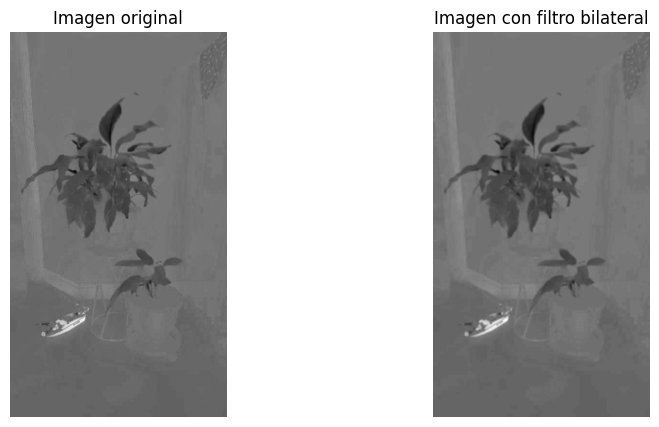

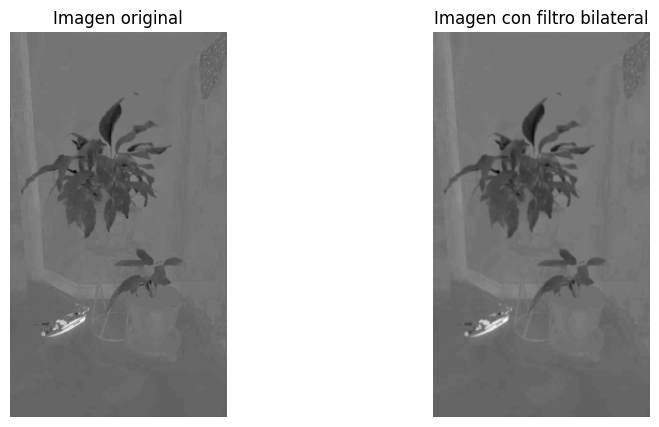

In [228]:
# Aplicar el filtro bilateral
img_filtro_bilateral = filtro_bilateral(img_A_LAB, 9, 75, 75)

# Aplicar el filtro bilateral
img_filtro_bilateral = filtro_bilateral(img_A_LAB, 9, 100, 100)

## Detección de bordes

In [229]:
# Función para interpolar los puntos entre 0 y 255
def img_scale(img, value_range = [0,255]):
    return (value_range[1] - value_range[0])*(img - np.min(img))/(np.max(img)-np.min(img)) + value_range[0]

# Función para enviar los extremos superior e inferior a 0 y 255 respectivamente en la matriz
def img_trim(img, value_range = [0, 255]):
    res = img.copy()
    res[res > 255] = 255
    res[res < 0] = 0
    return res

### Convolución Laplaciana

In [230]:
def convolucion_laplaciana(img):

    #Crear la máscara de convolución
    mask1 = np.array([[-1,-1,-1],
                     [-1,8,-1],
                     [-1,-1,-1]])

    #Realizar la convolución
    laplace_filtered = cv2.filter2D(img, ddepth = -1, kernel=mask1)

    #Generar subplot 1x2 para mostrar imagen original y convolución Laplaciana
    fig, ax = plt.subplots(1,2, figsize=(15, 8))
    ax[0].set_title('Imagen Original')
    ax[0].imshow(img, cmap='gray')
    ax[1].set_title('Convolucion Laplaciana')
    ax[1].imshow(laplace_filtered, cmap='gray')

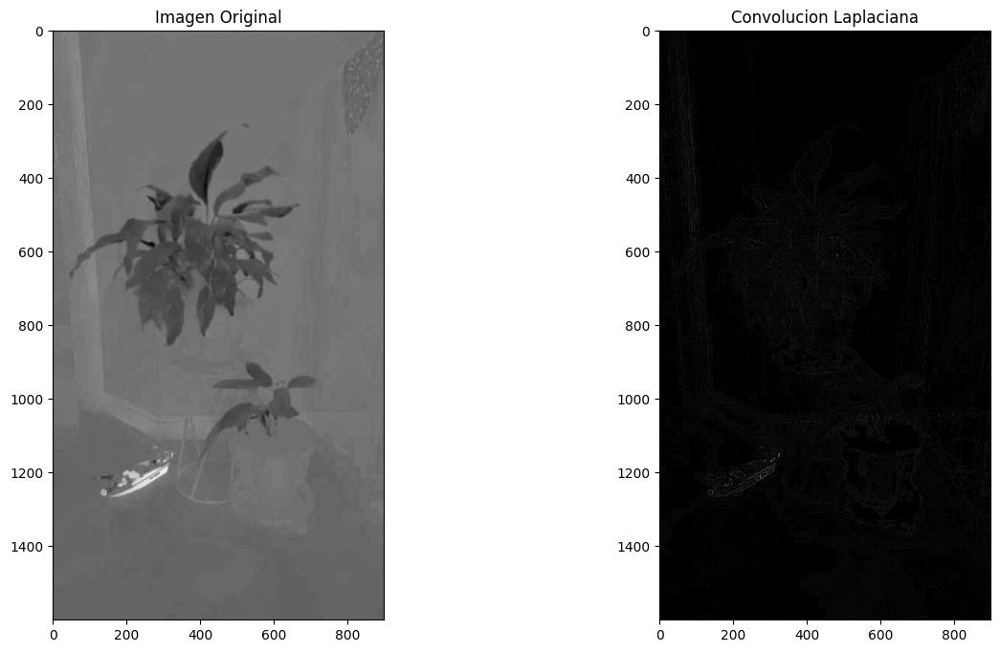

In [231]:
convolucion_laplaciana(img_A_LAB)

### Laplaciano para la Gaussiana

In [232]:
def laplaciano_gaussiano(img, sigma, kernel):

    #Aplicar un filtro Gaussiano y un Laplaciano sobre la Gaussiana
    res =  cv2.GaussianBlur(img, (kernel,kernel), sigma)
    res = cv2.Laplacian(res, ddepth = -1, ksize= 3)
    #Escalar los valores menores a 0 y mayores que 255
    res = img_trim(res)

    #Generar un subplot para mostrar imagen original y la Laplaciana de la Gaussiana
    fig2, ax = plt.subplots(1,2, figsize=(10, 7))
    ax[0].set_title('imagen original')
    ax[0].imshow(img, cmap='gray')
    ax[1].set_title('Laplaciana de la Gaussiana con sigma= '+str(sigma))
    ax[1].imshow(res, cmap='gray')

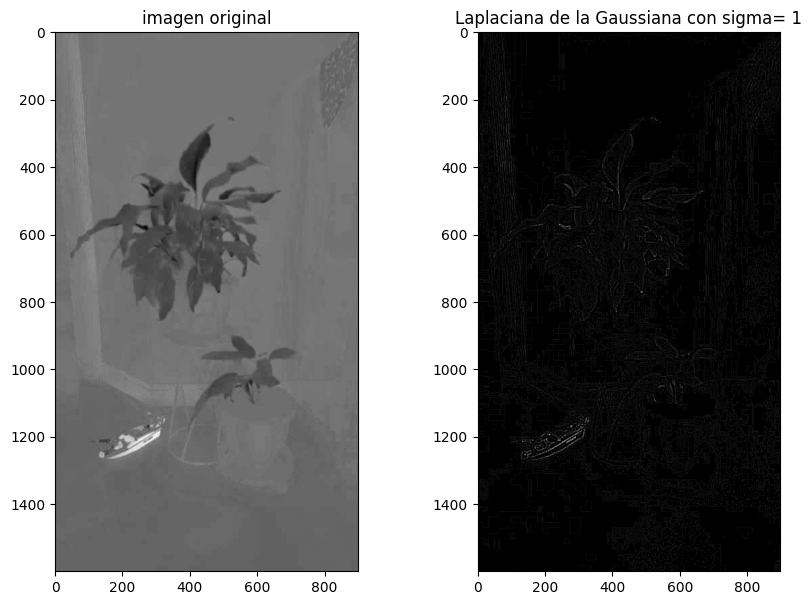

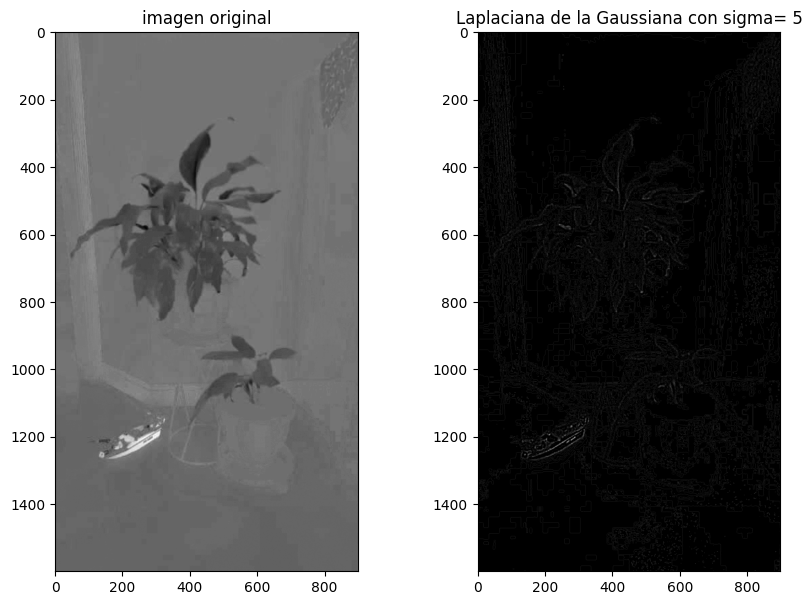

In [233]:
# Aplicar el Laplaciano para la Gaussiana
laplaciano_gaussiano(img_A_LAB, 1, 5)

# Aplicar el Laplaciano para la Gaussiana
laplaciano_gaussiano(img_A_LAB, 5, 5)

### Convolución para Detección de Líneas

In [234]:
def convolucion_lineas(img):
    mask1 = np.array([[-1,-1,-1],
                      [2,2,2],
                      [-1,-1,-1]], dtype=float)

    mask2 = np.array([[-1,2,-1],
                      [-1,2,-1],
                      [-1,2,-1]], dtype=float)

    mask3 = np.array([[2,-1,-1],
                      [-1,2,-1],
                      [-1,-1,2]], dtype=float)

    mask4 = np.array([[-1,-1,2],
                      [-1,2,-1],
                      [2,-1,-1]], dtype=float)

    #Ya que todos los filtros son lineales, aplicar por separado y luego sumar
    #las imágenes resultantes.

    imgf1 = cv2.filter2D(img, ddepth = -1, kernel=mask1)
    imgf2 = cv2.filter2D(img, ddepth = -1, kernel=mask2)
    imgf3 = cv2.filter2D(img, ddepth = -1, kernel=mask3)
    imgf4 = cv2.filter2D(img, ddepth = -1, kernel=mask4)

    #Nota: pruebe distintas combinaciones de los valores.

    #Sumar los filtros, aplicarle trim para escalar los valores
    res = img_scale(imgf1+imgf2+imgf3+imgf4)
    res = imgf1
    res = img_trim(res)

    #Generar subplot 1x2 y mostrar imagen original e imagen con extracción de bordes
    fig, (ax1,ax2) = plt.subplots(1,2, figsize=(15, 8))
    ax1.set_title('Imagen Original')
    ax1.imshow(img, cmap='gray')
    ax2.set_title('Extracción de bordes')
    ax2.imshow(res, cmap='gray')

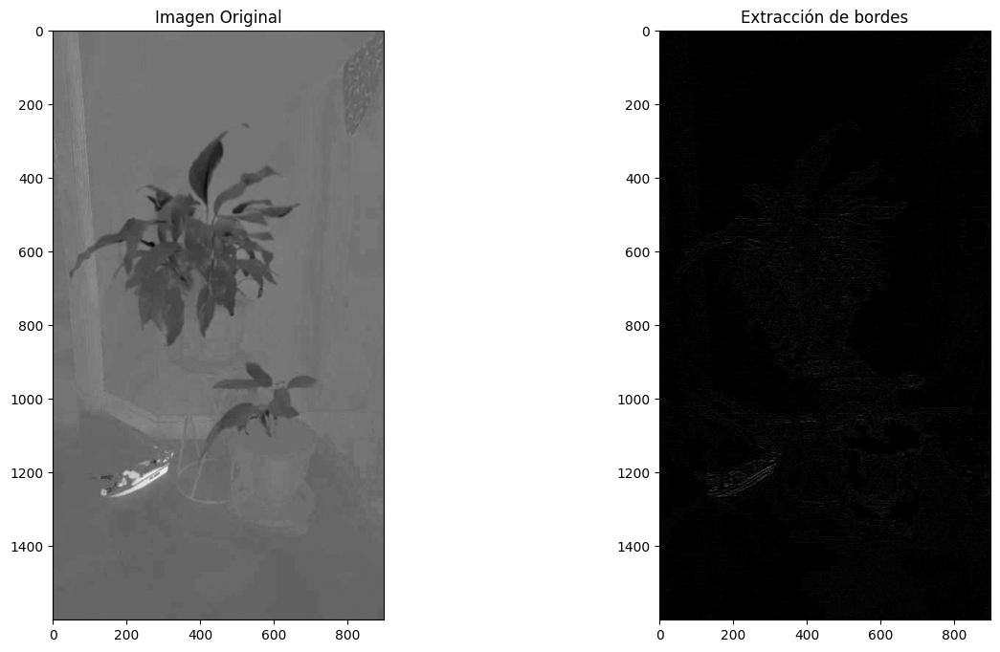

In [235]:
# Aplicar la convolución para detección de líneas
convolucion_lineas(img_A_LAB)

### Operador de Sobel

In [259]:
def operador_sobel(img, kernel):
    #La función Sobel recibe: la imagen, el parámetro ddepth, el orden de la derivada que queremos calcular
    #en x, el orden de la deirvada que queremos calcular en y, el tamaño del kernel.
    gradiente_x = cv2.Sobel(img, ddepth=-1, dx = 1, dy = 0, ksize = 3)
    gradiente_y = cv2.Sobel(img, ddepth=-1, dx = 0, dy = 1, ksize = 3)

    #Calcula la magnitud del sobel, por definición
    magnitud_sobel = np.sqrt(np.power(gradiente_x,2)+np.power(gradiente_y,2))

    #Realizar el escalamiento de la imagen
    magnitud_sobel = img_scale(magnitud_sobel)

    #Generar subplot 2x2 para mostrar la imagen original, sus gradientes x e y & la magnitud
    fig, ax = plt.subplots(2,2, figsize=(15, 16))
    ax[0,0].set_title('Imagen Original')
    ax[0,0].imshow(img, cmap='gray')
    ax[0,1].set_title('Gradiente en x (sobel)')
    ax[0,1].imshow(gradiente_x, cmap='gray')
    ax[1,0].set_title('Gradiente en y (sobel)')
    ax[1,0].imshow(gradiente_y, cmap='gray')
    ax[1,1].set_title('Magnitud del gradiente (sobel)')
    ax[1,1].imshow(magnitud_sobel, cmap='gray')

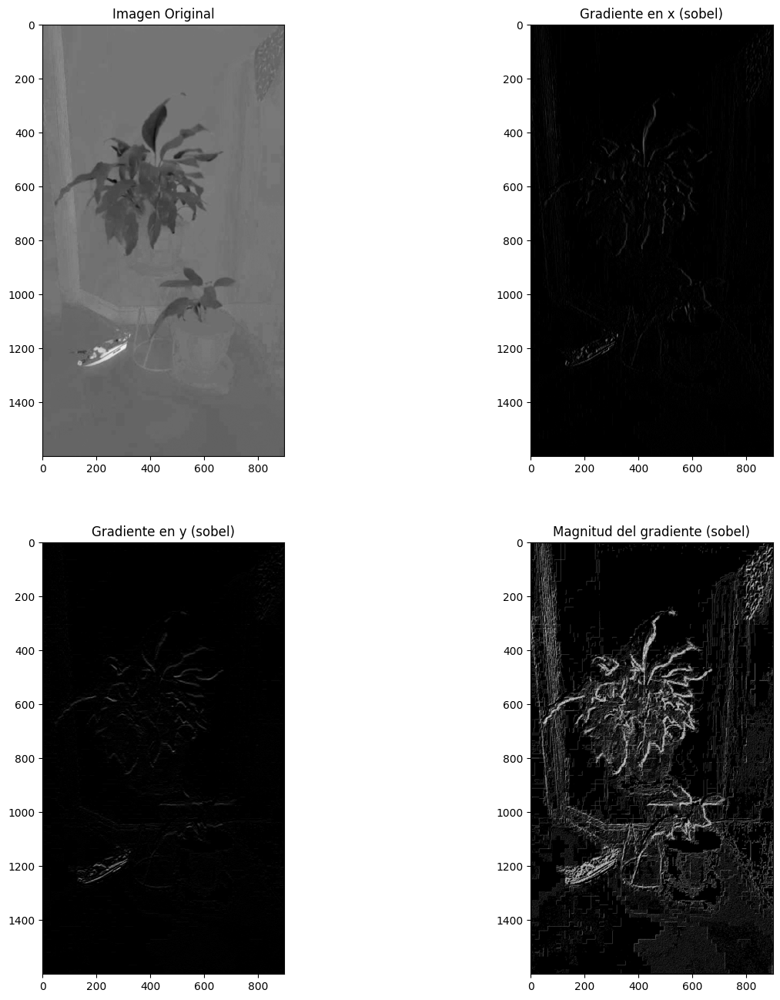

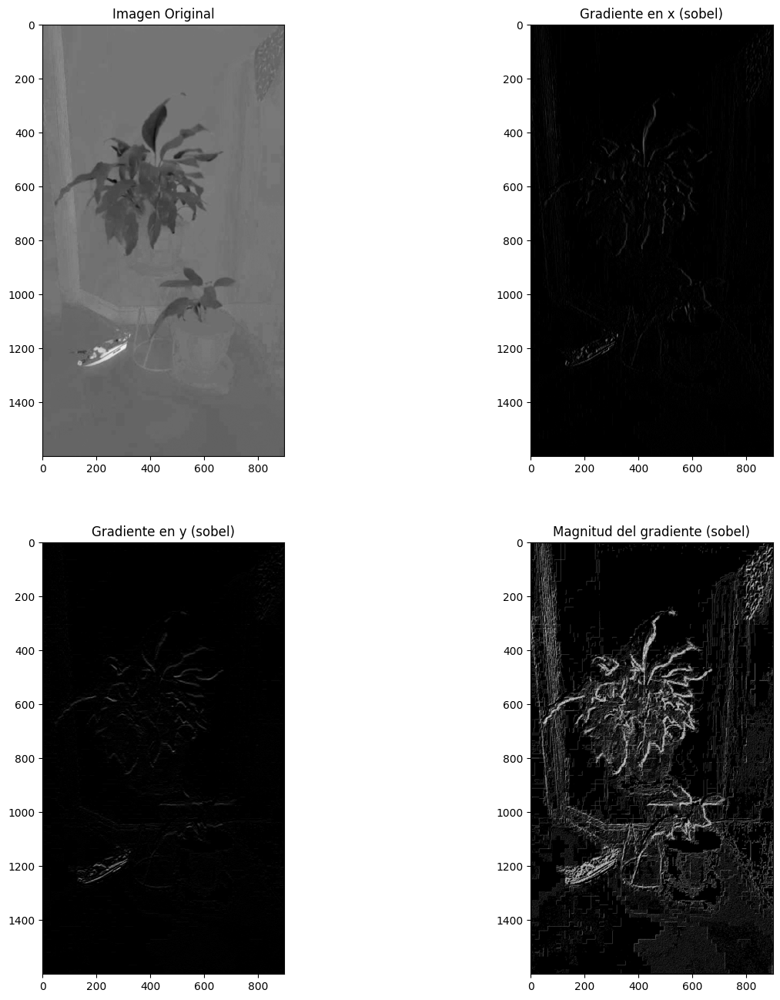

In [260]:
# Aplicar el operador de Sobel con un kernel de 3x3
operador_sobel(img_A_LAB, 3)

# Aplicar el operador de Sobel con un kernel de 5x5
operador_sobel(img_A_LAB, 8)

### Filtro de Prewwit

In [262]:
def filtro_prewitt(img):
    #Crear las máscaras del filtro Prewitt
    prewitt_x=np.array([[-1,0,1],
                       [-1,0,1],
                       [-1,0,1]],dtype=int)


    prewitt_y=np.array([[-1,-1,-1],
                       [0,0,0],
                       [1,1,1]],dtype=int)

    imgc1 = cv2.filter2D(img, ddepth=-1, kernel=prewitt_x)
    imgc2 = cv2.filter2D(img, ddepth=-1, kernel= prewitt_y)

    #Calcular la magnitud
    magnitud_prewitt = np.sqrt(np.power(imgc1,2)+np.power(imgc2,2))

    #Escalar los datos
    magnitud_prewitt = img_scale(magnitud_prewitt)

    #Generar un subplot 1x2 para mostrar imagen original y la magnitud del gradiente Prewitt
    fig, (ax1,ax2) = plt.subplots(1,2, figsize=(15, 8))
    ax1.set_title('Imagen original')
    ax1.imshow(img, cmap='gray')
    ax2.set_title('Magnitud del gradiente')
    ax2.imshow((magnitud_prewitt), cmap='gray')

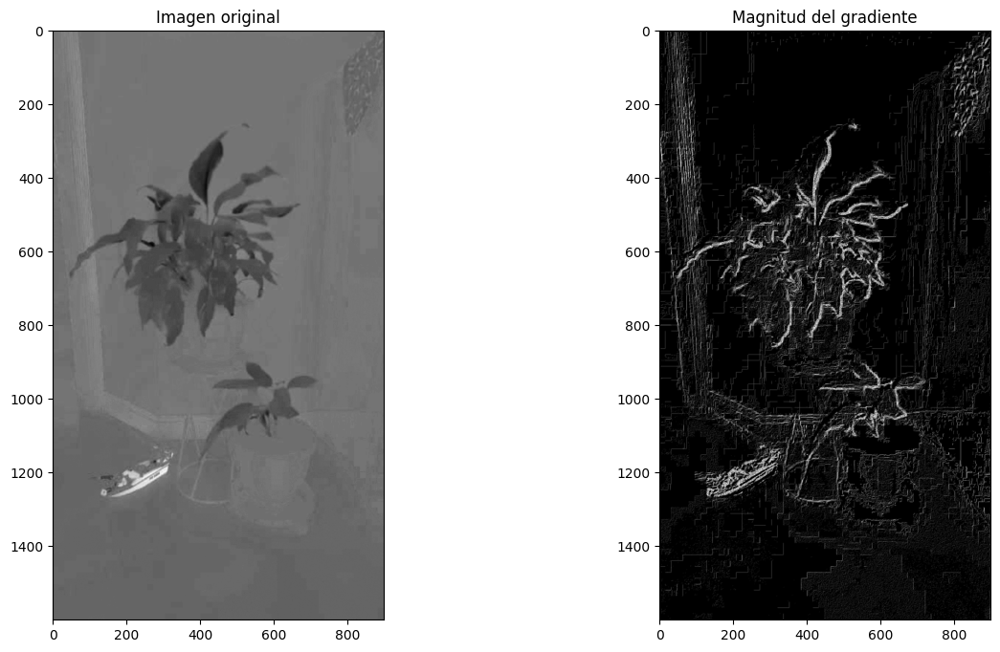

In [263]:
# Aplicar el filtro de Prewitt
filtro_prewitt(img_A_LAB)

### Algoritmo de Canny

In [240]:
def algoritmo_canny(img, threshold1, threshold2):

    #Aplicar el filtro de Canny como función de cv2 y darle límite entre 0 y 255
    result = cv2.Canny(img, threshold1, threshold2)

    #Generar un subplot 1x2 que muestre imagen original y Canny
    fig2, ax = plt.subplots(1,2, figsize=(10, 7))
    ax[0].set_title('imagen original')
    ax[0].imshow(img, cmap='gray')
    ax[1].set_title('Canny con threshold1: ' + str(threshold1) + ' y threshold2: ' + str(threshold2))
    ax[1].imshow(result, cmap='gray')

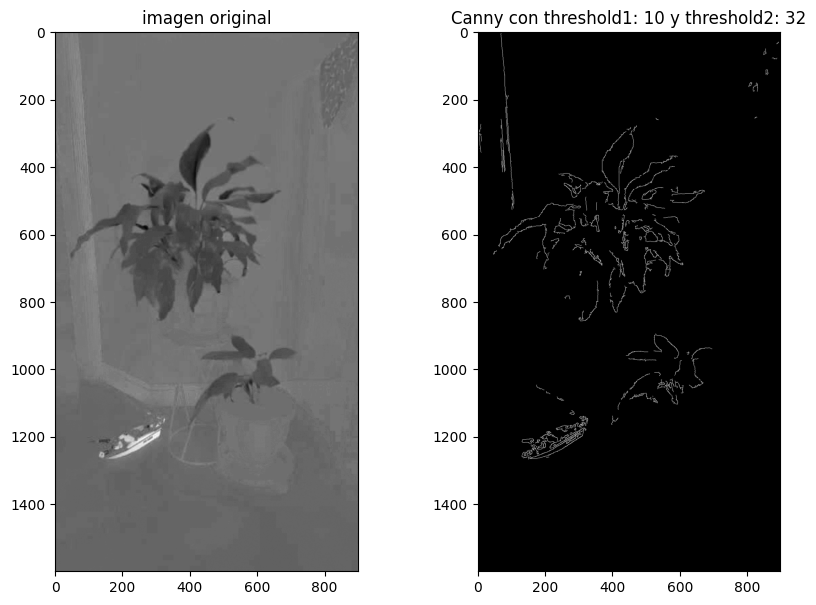

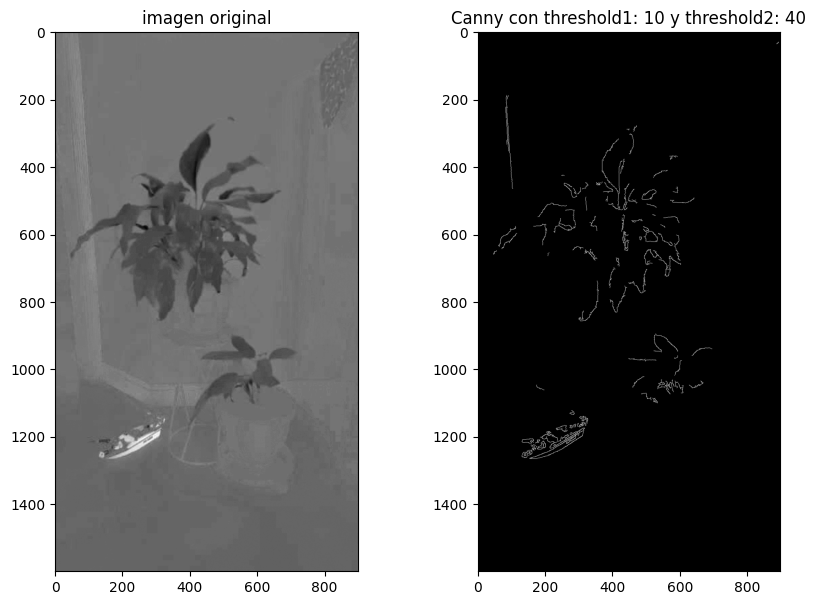

In [241]:
# Aplicar el algoritmo de Canny con sigma=1, threshold1=100, threshold2=200
algoritmo_canny(img_A_LAB, 10, 32)

# Aplicar el algoritmo de Canny con sigma=2, threshold1=50, threshold2=150
algoritmo_canny(img_A_LAB, 10, 40)

### Transformada de Hough

Para la transformada de Hough, dada la teoría y el uso más razonable de esta, decidimos no usarla, ya que por lo visto en más usada cuando se intenta detectar líneas rectas y/o círculos en una imagen, lo cual no es el caso de la imagen que estamos analizando. Por lo tanto, no se aplicará la transformada de Hough en este caso.

## Comparación de algunos resultados

### Filtro Gaussiano con Kernel 9 y Algoritmo de Canny con Threshold1 = 10 y Threshold2 = 32

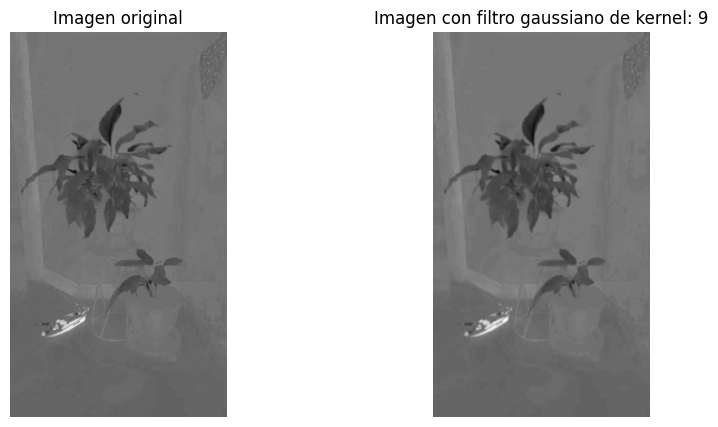

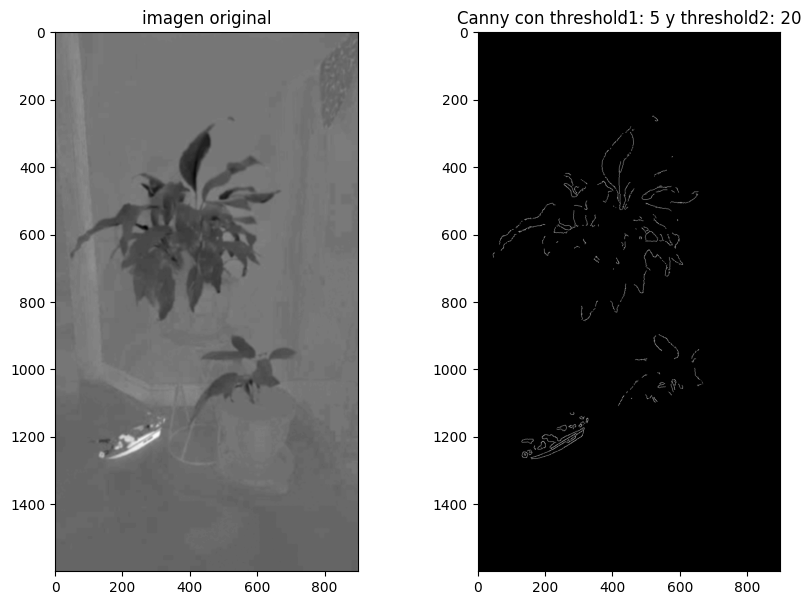

In [264]:
# Aplicar el filtro gaussiano con un kernel de 9x9
img_filtro_gaussiano_2 = filtro_gaussiano(img_A_LAB, 9)

# Aplicar el algoritmo de Canny con threshold1=10 y threshold2=32
algoritmo_canny(img_filtro_gaussiano_2, 5, 20)

Podemos ver que está combinación no nos aporta del todo a la detección de los bordes, ya que si bien es cierto que detecta algunos bordes, son bordes parciales y no logran detectar el objeto de interés en su totalidad. Por lo tanto, se procederá a realizar otra combinación de filtros y algoritmos de detección de bordes.

### Filtro de Mediana con Kernel 9 y Operador de Sobel con Kernel 3

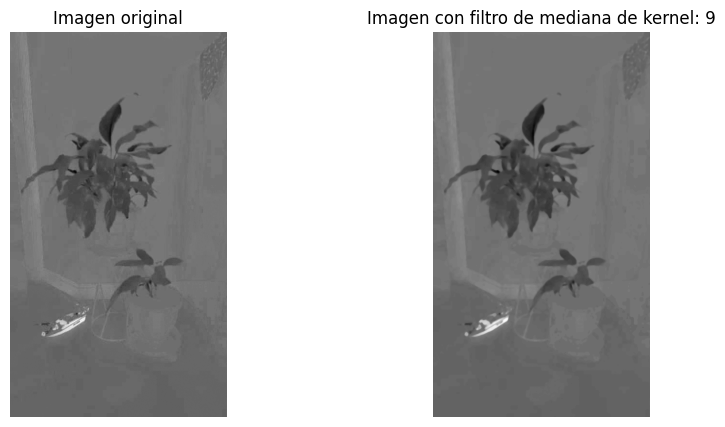

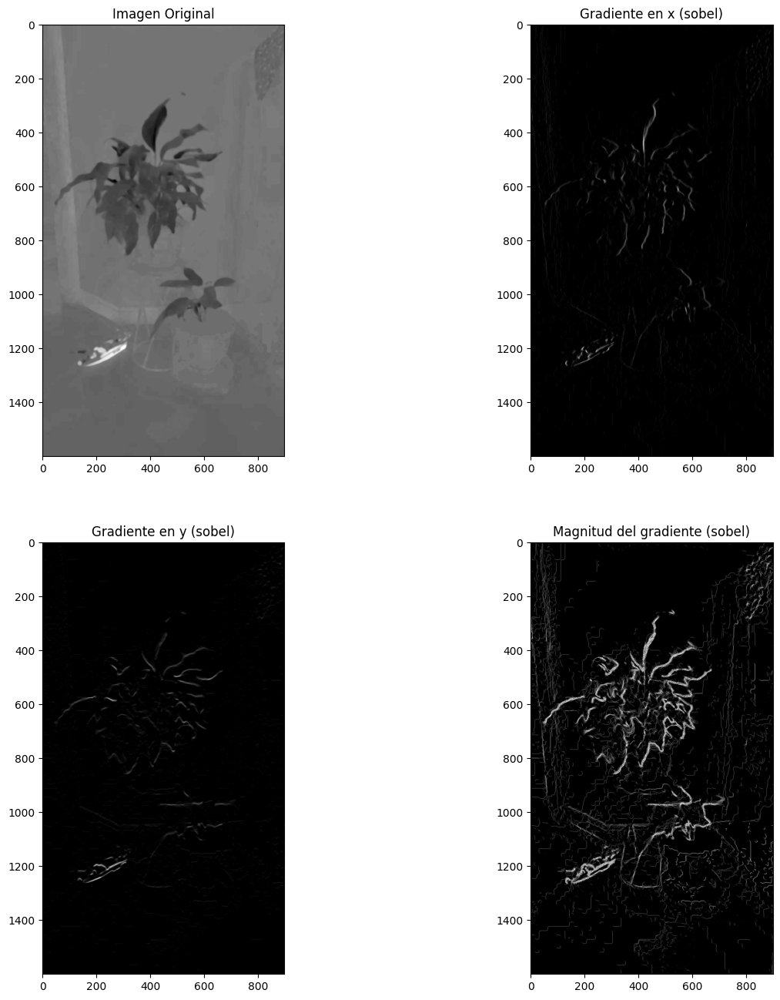

In [265]:
# Aplicar el filtro de mediana con un kernel de 9x9
img_filtro_mediana_2 = filtro_mediana(img_A_LAB, 9)

# Aplicar el operador de Sobel con un kernel de 3x3
operador_sobel(img_filtro_mediana_2, 3)

En este caso, la combinación de filtro de mediana con kernel 9 y operador de Sobel con kernel 3, a simple vista detecta algo mejor los bordes de las hojas de la planta, empero, en una revisión más detallada nos podemos dar cuenta de que en gran medida detecta la parte de abajo, y la parte de encima no lo hace muy bien. Además, sigue detectando ruido correspondiente al barco que se encuentra en la parte inferior izquierda y otro ruido correspondiente al fondo y dispersado por toda la imagen, por lo que no es muy útil a fin de cuentas. Por lo tanto, se procederá a realizar otra combinación de filtros y algoritmos de detección de bordes.

### Filtro bilateral con sigmaColor=100 y sigmaSpace=100 y Filto de Prewitt

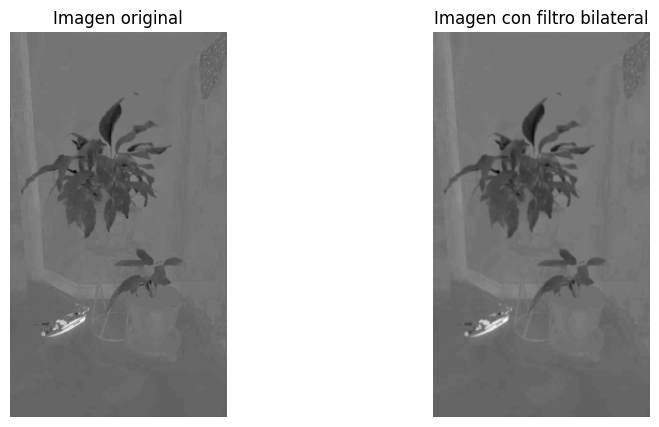

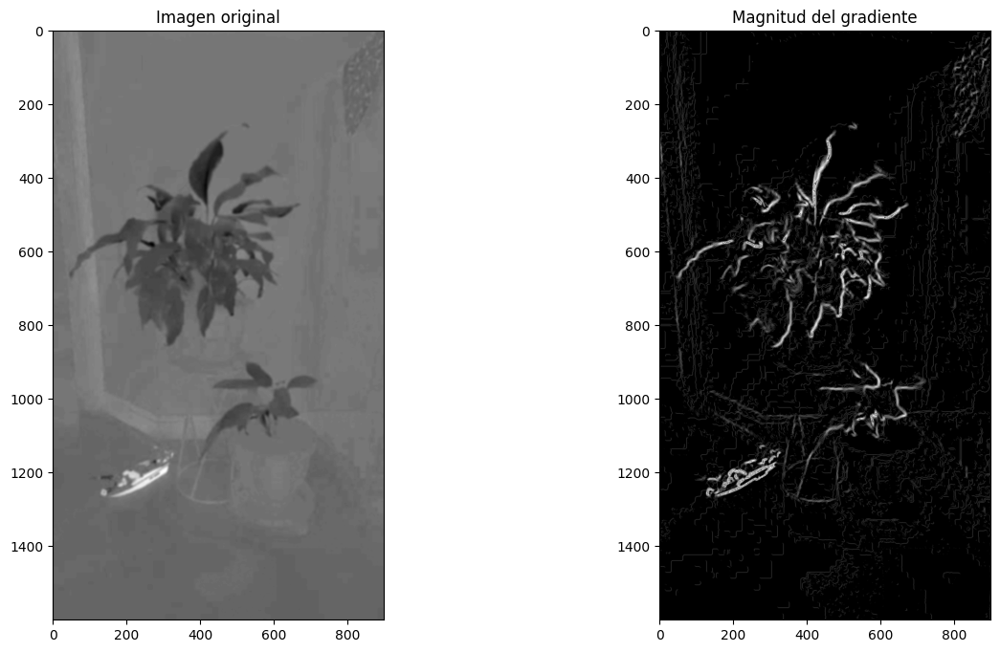

In [266]:
# Aplicar el filtro bilateral con sigmaColor=100 y sigmaSpace=100
img_filtro_bilateral = filtro_bilateral(img_A_LAB, 9, 100, 100)

# Aplicar el filtro de Prewitt
filtro_prewitt(img_filtro_bilateral)

En este caso, nuevamente presentamos algo muy parecido a lo que se presentó en la combinación anterior, ya que si bien es cierto que detecta los bordes de las hojas de la planta, sigue detectando ruido correspondiente al barco que se encuentra en la parte inferior izquierda y otro ruido correspondiente al fondo y dispersado por toda la imagen, aunque un poco más reducido. Procederemos a realizar un último intento con otra combinación de filtros y algoritmos de detección de bordes.

### Filtro de la media con Kernel 9 y Laplaciano para la Gaussiana con sigma=5

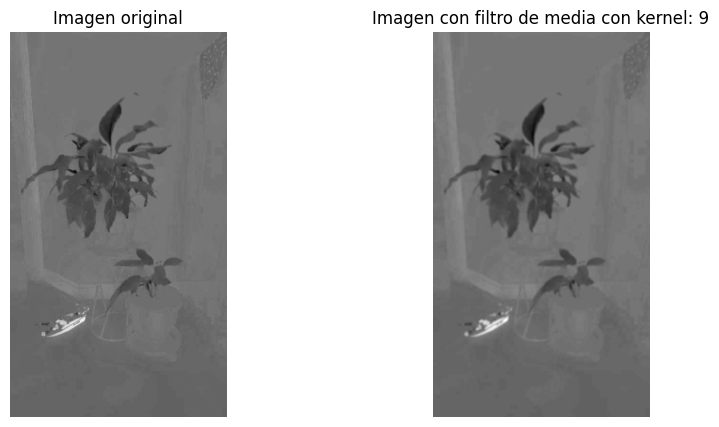

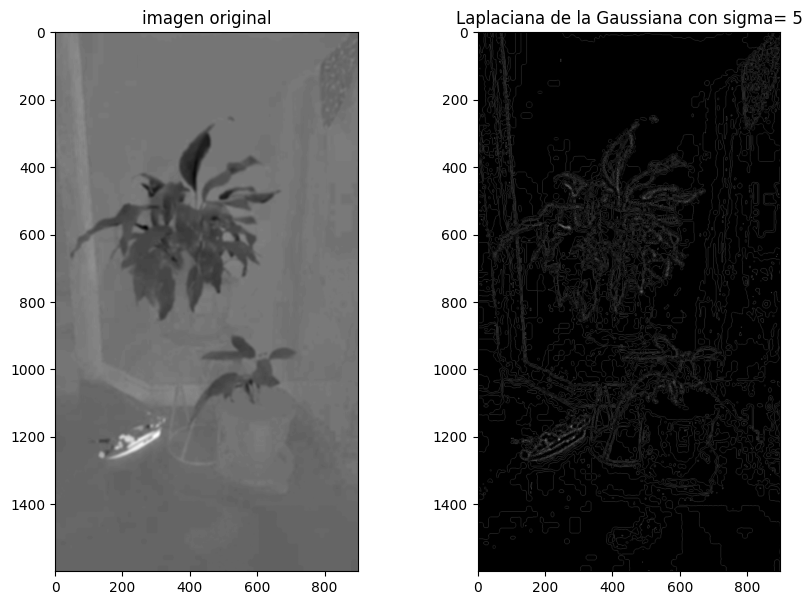

In [267]:
# Aplicar el filtro de media con un kernel de 9x9
img_filtro_media_2 = filtro_media(img_A_LAB, 9)

# Aplicar el Laplaciano para la Gaussiana con sigma=5
laplaciano_gaussiano(img_filtro_media_2, 5, 5)

En esta combinación, obtenemos resultados bastante interesantes, pues parece ser que se detectan los bordes de la imagen completa muy bien, empero, sigue siendo bastante difícil continuar desde este punto dado que hay bastantes bordes que corresponden a lo que es ruido para nuestra imagen, es decir, que no son parte del objeto de interés. Así pues, a pesar de que es una combinación se distingue bastante bien los bordes, no es suficiente para la detección del objeto de interés. Por lo tanto, se procederá a realizar una última combinación de filtros y algoritmos de detección de bordes.

# Punto 4 (10%)

Con su imagen original (sin ninguna modificación), desarrolle el siguiente ejercicio:


Usando las transformaciones geométricas, realice una reflexión horizontal de la imagen original. La idea es crear una nueva imagen, donde su mitad izquierda sea la imagen original y su mitad derecha sea la imagen reflejada. De esta imagen, realice una traslación en el eje y del 10% de la dimensión de y, para al final realizar una rotación de 30 grados de la imagen. El resultado esperado es realizar una comparativa de la imagen original con la imagen transformada




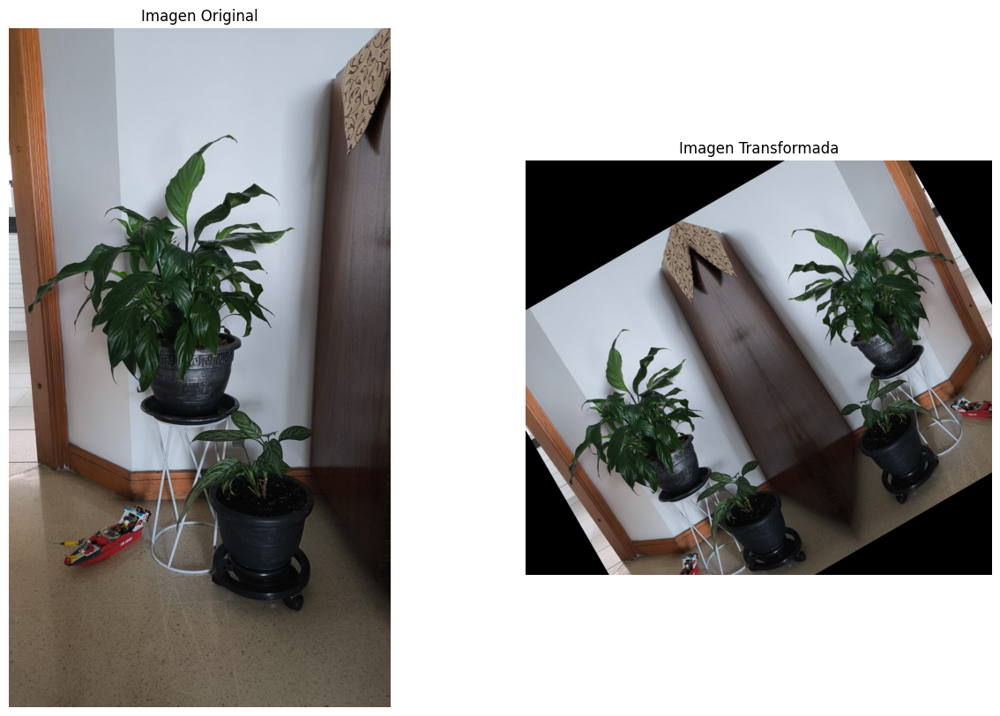

In [246]:
# Realizar una reflexión horizontal de la imagen
img_reflejada = cv2.flip(img, 1)

# Crear una nueva imagen donde la mitad izquierda sea la imagen original y la mitad derecha sea la imagen reflejada
img_concatenada = np.concatenate((img, img_reflejada), axis=1)

# Realizar una traslación en el eje y del 10% de la dimensión de y
altura, anchura, _ = img_concatenada.shape
traslacion_y = int(0.1 * altura)
M_traslacion = np.float32([[1, 0, 0], [0, 1, traslacion_y]])
img_trasladada = cv2.warpAffine(img_concatenada, M_traslacion, (anchura, altura))

# Realizar una rotación de 30 grados de la imagen
centro = (anchura // 2, altura // 2)
M_rotacion = cv2.getRotationMatrix2D(centro, 30, 1.0)
img_rotada = cv2.warpAffine(img_trasladada, M_rotacion, (anchura, altura))

# Mostrar la imagen original y la imagen transformada para compararlas
fig, axs = plt.subplots(1, 2, figsize=(15, 10))

# Mostrar la imagen original
axs[0].imshow(img)
axs[0].set_title('Imagen Original')
axs[0].axis('off')

# Mostrar la imagen transformada
axs[1].imshow(img_rotada)
axs[1].set_title('Imagen Transformada')
axs[1].axis('off')

plt.show()

# Punto 5 (40%)

Usted deberá segmentar el objeto de interés presente en una imagen previamente procesada. Para ello, seleccione un método de segmentación adecuado y aplíquelo. Una vez segmentado el objeto, refine los resultados mediante la aplicación de operaciones morfológicas. A continuación, extraiga un conjunto de características relevantes del objeto segmentado, tales como características geométricas, texturales o de color. Organice estas características en un dataset, creando así una representación numérica del objeto. Aunque esta representación podría ser utilizada para entrenar un modelo de clasificación, en esta ocasión se limitará a esta etapa de extracción de características.

## Preprocesamiento

Lo primero es convertir la imagen al canal A del espacio LAB

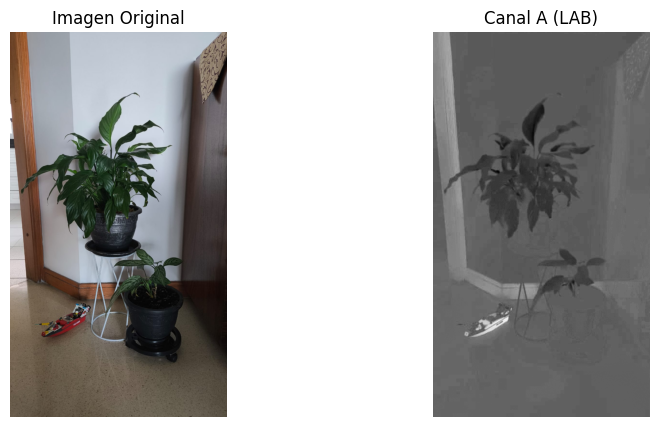

In [247]:
# Convertir la imagen al espacio de color LAB
img_lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
img_lab_a = img_lab[:, :, 1]  # Extraer el canal A

# Mostrar la imagen original y el canal A de LAB
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Mostrar la imagen original
axs[0].imshow(img)
axs[0].set_title('Imagen Original')
axs[0].axis('off')

# Mostrar el canal A de LAB
axs[1].imshow(img_lab_a, cmap='gray')
axs[1].set_title('Canal A (LAB)')
axs[1].axis('off')

plt.show()

Aplicamos un suavizado

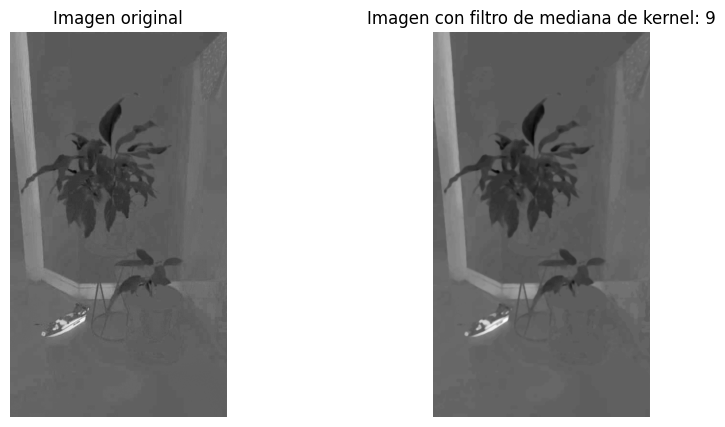

In [248]:
# Aplicar el filtro de mediana con un kernel de 9x9
img_filtro_mediana_2 = filtro_mediana(img_lab_a, 9)

Aplicamos una de las transformaciones no lineales que nos funcionó bien.

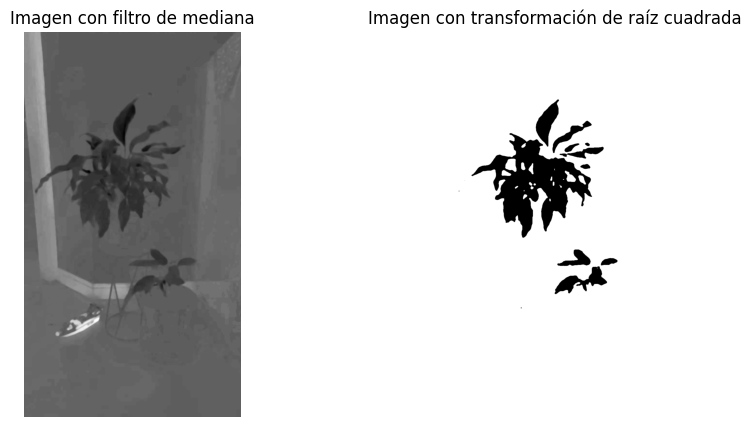

In [249]:
# Aplicar la transformación de raíz cuadrada al canal A del espacio LAB
img_sqrt_transformed = sqrt_transformation(img_filtro_mediana_2, 0.2, 0.8)

# Mostrar la imagen original y la imagen transformada
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Mostrar la imagen original
axs[0].imshow(img_filtro_mediana_2, cmap='gray')
axs[0].set_title('Imagen con filtro de mediana')
axs[0].axis('off')

# Mostrar la imagen transformada
axs[1].imshow(img_sqrt_transformed, cmap='gray')
axs[1].set_title('Imagen con transformación de raíz cuadrada')
axs[1].axis('off')

plt.show()

## Segmentación
No se hace debido a que la imagen ya está suficientemente bien segmentada.

## Operaciones Morfológicas

Aplicar una apertura para quitar los pequeños puntos que no son de interés y terminan siendo ruido de la imagen.


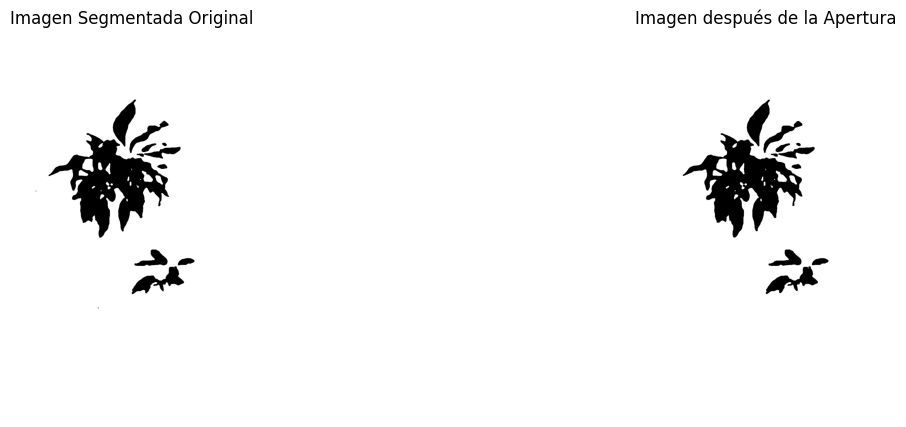

In [250]:
# Invertir los colores de la imagen transformada
img_invertida = cv2.bitwise_not(img_sqrt_transformed)

# Aplicar una operación de apertura para eliminar pequeños puntos negros
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))  # Aumentar el tamaño del kernel
img_opening = cv2.morphologyEx(img_invertida, cv2.MORPH_OPEN, kernel)

# Invertir los colores de nuevo para obtener la imagen final
img_final = cv2.bitwise_not(img_opening)

# Mostrar la imagen original y la imagen después de la apertura
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# Mostrar la imagen segmentada original
axs[0].imshow(img_sqrt_transformed, cmap='gray')
axs[0].set_title('Imagen Segmentada Original')
axs[0].axis('off')

# Mostrar la imagen después de la apertura
axs[1].imshow(img_final, cmap='gray')
axs[1].set_title('Imagen después de la Apertura')
axs[1].axis('off')

plt.show()


## Imagen segmentada final

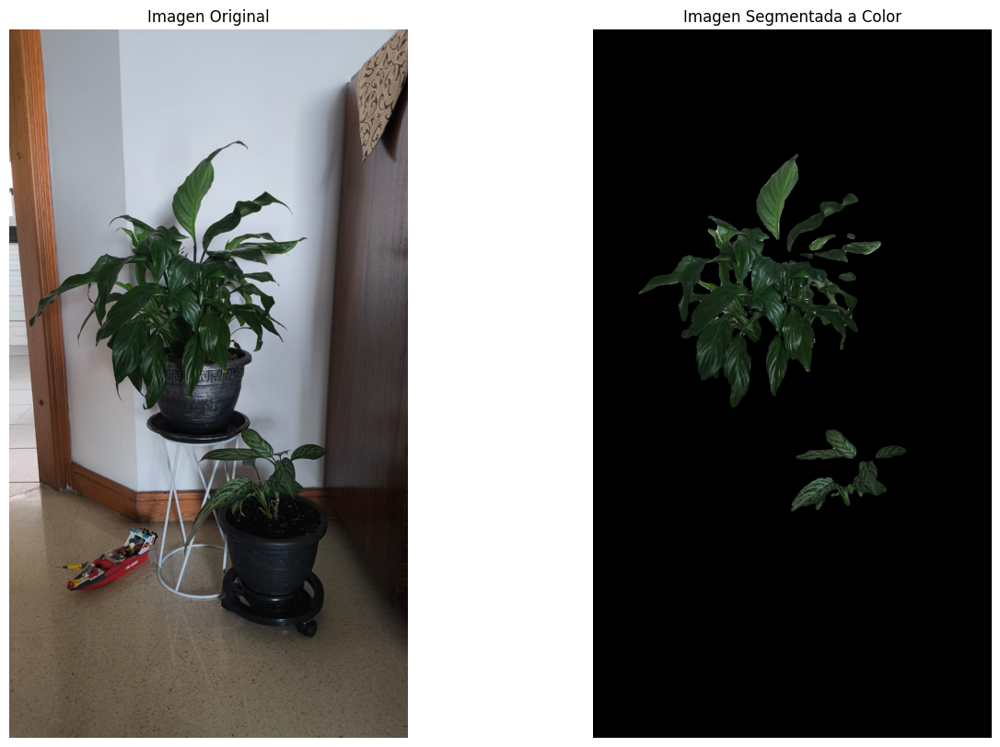

In [251]:
# Asegurarse de que la máscara esté en el formato correcto (0 y 255)
img_final_mask = (img_final == 3).astype(np.uint8) * 255

# Invertir la máscara
img_final_mask_invertida = cv2.bitwise_not(img_final_mask)

# Multiplicar la imagen original por la imagen segmentada para obtener la imagen segmentada a color
img_segmentada_color = cv2.bitwise_and(img, img, mask=img_final_mask_invertida)

# Mostrar la imagen original y la imagen segmentada a color
fig, axs = plt.subplots(1, 2, figsize=(15, 10))

# Mostrar la imagen original
axs[0].imshow(img)
axs[0].set_title('Imagen Original')
axs[0].axis('off')

# Mostrar la imagen segmentada a color
axs[1].imshow(img_segmentada_color)
axs[1].set_title('Imagen Segmentada a Color')
axs[1].axis('off')

plt.show()

##Extracción de características

La primera extracción de características que se realiza es una extracción de color y textura, temas importantes en el ámbito de las plantas. Se hace ante un posible análisis de la colorimetría de las plantas que han sido segmentadas, por lo que son importantes sus características de color, entre las que se destacan características de luminiscencia del canal LAB y saturación del HSV

### Métodos de Primer Orden (Para color)

In [252]:
#Definir la función para obtener características del espacio LAB y HSV
def get_lab_hsv_features(im, features):
    #La imagen de entrada debe estar en el espacio RGB
    #Extraer el tamaño de la imagen de entrada y convertirla a LAB y HSV
    shape = np.shape(im)
    im_lab = cv2.cvtColor(im, cv2.COLOR_RGB2LAB)
    im_hsv = cv2.cvtColor(im, cv2.COLOR_RGB2HSV)

    #Definir los canales l,a,b por separado
    h_1 = im_lab[:,:,0]
    s_1 = im_hsv[:,:,1]
    v_1 = im_hsv[:,:,2]

    #Utilizar features para guardar los valores de media, desviación estándar, kurtosis y sesgo
    #de cada uno de los canales h_1, s_1, v_1
    features['h_mean'] = np.mean(h_1)
    features['h_std'] = np.std(h_1)
    features['h_kurtosis'] = kurtosis(h_1)
    features['h_skew'] = skew(h_1)
    features['s_mean'] = np.mean(s_1)
    features['s_std'] = np.std(s_1)
    features['v_kurtosis'] = kurtosis(v_1)
    features['v_skew'] = skew(v_1)
    features['v_mean'] = np.mean(v_1)
    features['v_std'] = np.std(v_1)
    features['s_kurtosis'] = kurtosis(s_1)
    features['s_skew'] = skew(s_1)
    return features

#Definir función para extraer características del espacio RGB
def get_rgb_features(im, features):
    #Crear una matriz del mismo tamaño de la imagen de entrada, leer los canales R,G,B y
    #crear listas vacías donde se aplica la máscara
    shape = np.shape(im)
    r_1 = im[:,:,0]
    g_1 = im[:,:,1]
    b_1 = im[:,:,2]

    #Utilizar features para guardar los valores de media, desv.estandar, kurtosis y sesgo
    #de los canales r_1,g_1,b_1
    features['r_mean'] = np.mean(r_1)
    features['r_std'] = np.std(r_1)
    features['r_kurtosis'] = kurtosis(r_1)
    features['r_skew'] = skew(r_1)
    features['g_mean'] = np.mean(g_1)
    features['g_std'] = np.std(g_1)
    features['b_kurtosis'] = kurtosis(b_1)
    features['b_skew'] = skew(b_1)
    features['b_mean'] = np.mean(b_1)
    features['b_std'] = np.std(b_1)
    features['g_kurtosis'] = kurtosis(g_1)
    features['g_skew'] = skew(g_1)
    return features

In [253]:
#Función de extracción de características de los canales rgb, lab-hsv
def features_color(img, features):
    features = get_rgb_features(img,features)
    features = get_lab_hsv_features(img,features)
    return features

### Métodos de Segundo Orden (para Color)

In [254]:
# Función de estadísticos de segundo orden
def get_glcm_features(img,features):

    #Calcular el nivel co-ocurrente de gris
    glcm = graycomatrix(img, [1,2,3], [0], 256, symmetric=True, normed=True)
    #Calcular la dissimilaridad, contraste, homogeneidad, ASM, energía y correlación, guardar esto en la matriz
    #de features
    features['dissimilarity'] = graycoprops(glcm, 'dissimilarity')[0][0]
    features['contrast'] = graycoprops(glcm, 'contrast')[0][0]
    features['homogeneity'] = graycoprops(glcm, 'homogeneity')[0][0]
    features['ASM'] = graycoprops(glcm, 'ASM')[0][0]
    features['energy'] = graycoprops(glcm, 'energy')[0][0]
    features['correlation'] = graycoprops(glcm, 'correlation')[0][0]

    return features

In [255]:
def features_pipeline(img, features):
    #Convertir la imagen de RGB a escala de grises
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    #Obtener las características de la imagen
    features = get_glcm_features(img_gray, features)
    return features

### Bounding Box

In [256]:
def bounding_features(img, features):
    label_img = label(img)
    props = regionprops(label_img)

    #Utilizar la función bbox para buscar los 4 puntos que conforman el rectángulo más pequeño
    #que puede contener la región etiquetada
    minr, minc, maxr, maxc = props[0].bbox
    bx = (minc, maxc, maxc, minc, minc)
    by = (minr, minr, maxr, maxr, minr)

    features['bx'] = bx
    features['by'] = by

    return features

Los momentos de HU se omiten dado que no son relevantes para nuestro estudio pues estudian mas la forma de los objetos, lo que no es de nuestro interés

In [257]:
def get_features_area(props, features):

    features['orientation'] = props.orientation
    features['area_to_convex_ratio'] = props.area/props.convex_area
    features['compacity'] = props.perimeter**2/props.area
    features['roundness'] = 4*math.pi*props.area /(props.perimeter**2)
    #print(i)
    features['area_perimeter_ratio'] = props.area / props.perimeter
    features['elongation'] = props.major_axis_length/props.minor_axis_length
    features['solidity1'] = props.area/props.convex_area
    features['solidity2'] = props.area / props.filled_area
    return features

In [258]:
def get_features(img, imgori):
  features = {}
  img *= morphology.remove_small_objects(img.astype(bool), min_size = 20)
  label_img = label(img)
  props = regionprops(label_img)[0]
  features = features_color(imgori, features)
  features = features_pipeline(imgori, features)
  features = bounding_features(img, features)
  features = get_features_area(props, features)
  return features

features_0 = get_features(img_final, img)
columns = list(features_0.keys())


#crear dataset de características de entrenamiento como dataframe de pandas
datahojas = pd.DataFrame(columns=columns)

datahojas.loc[i] = [features_0[feature] for feature in features_0.keys()]

datahojas.head()

,r_mean,r_std,r_kurtosis,r_skew,g_mean,g_std,b_kurtosis,b_skew,b_mean,b_std,...,bx,by,orientation,area_to_convex_ratio,compacity,roundness,area_perimeter_ratio,elongation,solidity1,solidity2
2,110.796313,58.39796,"[-1.0594849149739205, -1.0597339424614296, -1....","[0.09871731588361739, 0.14427135852908698, 0.1...",107.210791,61.290618,"[-1.5367179810597216, -1.5350785582638857, -1....","[0.05225312918686734, 0.08201518158144977, 0.1...",103.176028,69.064963,...,"(0, 899, 899, 0, 0)","(0, 0, 1600, 1600, 0)",-0.008242,0.913696,88.875175,0.141393,121.60476,1.777856,0.913696,0.913696


---

# ¿Cómo enviar el parcial resuelto?

Para entregar el parcial resuelto, siga los siguientes pasos:

1. Asegúrese de ejecutar todas las celdas en su cuaderno Jupyter, de manera que todos los resultados y gráficos estén actualizados.
<br></br>
2. Guarde el cuaderno Jupyter para conservar los cambios realizados.
<br></br>
3. Reúna todas las imágenes de referencia utilizadas en el cuaderno Jupyter en una sola carpeta.
<br></br>
4. Comprima el cuaderno Jupyter y la carpeta de imágenes en un archivo ZIP/RAR o comprimido. Asegúrese de que el archivo comprimido contenga tanto el cuaderno como las imágenes de referencia.
<br></br>
5. Envíe el archivo ZIP/RAR comprimido como respuesta al correo electrónico en el que se envió el parcial. No olvide incluir al monitor en copia (sasalazarr@unal.edu.co) al enviar su respuesta.

Al seguir estos pasos, garantizará que el profesor y el monitor reciban su parcial resuelto junto con las imágenes de referencia utilizadas en su cuaderno Jupyter.

<b> Plazo para enviar el parcial: </b> Viernes 20 de septiembre del 2024, antes de las 18:00.